In [1]:
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle

In [2]:
print(torch.cuda.is_available())

True


In [3]:
# Проверяем, доступны ли GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
# Загрузка DataFrame из файла
with open(r'./datasets/seg_maps_dataset.pkl', 'rb') as f:
    df = pickle.load(f)

In [5]:
df = df.loc[df['Stats'].isin([1.e+08, 2.e+08, 5.e+08])]

df['Stats'].unique()

array([1.e+08, 2.e+08, 5.e+08])

In [6]:
crystals = np.array(df['Crystal'].unique())

df['Crystal'].unique()

array(['Al', 'Al2O3_sapphire', 'Ba', 'Be', 'BeO', 'C_diamond',
       'C_graphite', 'Cr', 'Cs', 'Cu', 'Cu2MnAl', 'Fe', 'Ga', 'Ge',
       'He4_hcp', 'I2', 'K', 'Mo', 'Na2Ca3Al2F14', 'Nb', 'Ni', 'Pb', 'Pt',
       'Rb', 'Si', 'Ti', 'Tl', 'UO2', 'Zn', 'Y2O3'], dtype=object)

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

X = df.drop(['Crystal', 'Stats', 'Pulce duration'], axis=1)

# Шаг 1: Преобразование строковых меток классов в числовые метки
label_encoder = LabelEncoder()

Stats = df['Stats']

y = df['Crystal']

y_encoded = label_encoder.fit_transform(y)

Diff_train, Diff_test, Stats_train, Stats_test, y_train, y_test = train_test_split(X, Stats, y_encoded, test_size=0.1, random_state=42)

In [8]:
import torch.nn.functional as F

# Преобразование матриц в numpy массив перед преобразованием в тензоры
Diff_train_matrices = np.array(Diff_train['Matrix'].tolist())
Diff_test_matrices = np.array(Diff_test['Matrix'].tolist())

Stats_train_matrices = np.array(Stats_train.tolist())
Stats_test_matrices = np.array(Stats_test.tolist())

# Преобразование данных в тензоры PyTorch
Diff_train_tensor = torch.FloatTensor(Diff_train_matrices)
Diff_train_tensor = Diff_train_tensor.unsqueeze(1)
#Diff_train_tensor = F.interpolate(Diff_train_tensor, size=(256, 480), mode='bicubic', align_corners=False)
Diff_train_tensor = Diff_train_tensor * 2.0 - 1.0
Stats_train_tensor = torch.FloatTensor(Stats_train_matrices)

y_train_tensor = torch.LongTensor(y_train)  # Используем LongTensor для целевых меток

Diff_test_tensor = torch.FloatTensor(Diff_test_matrices)
Diff_test_tensor = Diff_test_tensor.unsqueeze(1)
#Diff_test_tensor = F.interpolate(Diff_test_tensor, size=(256, 480), mode='bicubic', align_corners=False)
Diff_test_tensor = Diff_test_tensor * 2.0 - 1.0
Stats_test_tensor = torch.FloatTensor(Stats_test_matrices)

y_test_tensor = torch.LongTensor(y_test)

In [9]:
print(Diff_train_tensor.size())
print(Diff_test_tensor.size())

torch.Size([1620, 1, 250, 480])
torch.Size([180, 1, 250, 480])


In [10]:
from torch.utils.data import TensorDataset, DataLoader, random_split

# Создание набора данных
train_dataset = TensorDataset(Diff_train_tensor, y_train_tensor)

test_dataset = TensorDataset(Diff_test_tensor, y_test_tensor)

# Создание DataLoader для каждой выборки
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)

test_loader = DataLoader(test_dataset, batch_size=10, shuffle=False)

# Spatial UnConditional VAE ViT architecture

In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
from einops import rearrange, repeat

class PatchEmbedding(nn.Module):
    def __init__(self, img_size=(250, 480), patch_size=(10, 16), in_channels=1, embed_dim=512):
        super().__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.grid_size = (img_size[0] // patch_size[0], img_size[1] // patch_size[1])
        self.num_patches = self.grid_size[0] * self.grid_size[1]
        
        self.proj = nn.Conv2d(in_channels, embed_dim, 
                             kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        B, C, H, W = x.shape
        x = self.proj(x)  # (B, embed_dim, grid_h, grid_w)
        x = x.flatten(2).transpose(1, 2)  # (B, num_patches, embed_dim)
        return x
    
class PositionalEncoding(nn.Module):
    def __init__(self, embed_dim, num_patches):
        super().__init__()
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches, embed_dim))
        
    def forward(self, x):
        return x + self.pos_embed

class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, num_heads, mlp_ratio=4.0, dropout=0.1):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, dropout=dropout, batch_first=True)
        self.norm2 = nn.LayerNorm(embed_dim)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, int(embed_dim * mlp_ratio)),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(int(embed_dim * mlp_ratio), embed_dim),
            nn.Dropout(dropout)
        )
        
    def forward(self, x):
        # Self-attention
        x_norm = self.norm1(x)
        attn_out, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + attn_out
        
        # MLP
        x_norm = self.norm2(x)
        mlp_out = self.mlp(x_norm)
        x = x + mlp_out
        
        return x    

class ViTEncoderForLatentMaps(nn.Module):
    def __init__(self, img_size=(240, 480), patch_size=(10, 16), in_channels=1, 
                 embed_dim=512, depth=8, num_heads=8, mlp_ratio=4.0, 
                 latent_channels=256, dropout=0.1):
        super().__init__()
        
        self.patch_embed = PatchEmbedding(img_size, patch_size, in_channels, embed_dim)
        self.num_patches = self.patch_embed.num_patches
        self.grid_size = self.patch_embed.grid_size
        
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches, embed_dim))
        self.dropout = nn.Dropout(dropout)
        
        # Transformer blocks
        self.blocks = nn.ModuleList([
            TransformerBlock(embed_dim, num_heads, mlp_ratio, dropout)
            for _ in range(depth)
        ])
        
        self.norm = nn.LayerNorm(embed_dim)
        
        # Project to latent maps [B, latent_channels, grid_h, grid_w]
        self.latent_proj = nn.Linear(embed_dim, latent_channels)
        
    def forward(self, x):
        # Patch embedding
        x = self.patch_embed(x)  # (B, num_patches, embed_dim)
        
        # Add positional encoding
        x = x + self.pos_embed
        x = self.dropout(x)
        
        # Transformer blocks
        for block in self.blocks:
            x = block(x)
        
        x = self.norm(x)
        
        # Reshape to spatial grid and project to latent channels
        B, num_patches, embed_dim = x.shape
        h, w = self.grid_size
        x = x.view(B, h, w, embed_dim).permute(0, 3, 1, 2)  # (B, embed_dim, h, w)
        latent_maps = self.latent_proj(x.permute(0, 2, 3, 1)).permute(0, 3, 1, 2)  # (B, latent_channels, h, w)
        
        return latent_maps

class ViTDecoderForLatentMaps(nn.Module):
    def __init__(self, img_size=(240, 480), patch_size=(10, 16), in_channels=1,
                 embed_dim=512, depth=8, num_heads=8, mlp_ratio=4.0,
                 latent_channels=256, dropout=0.1):
        super().__init__()
        
        self.img_size = img_size
        self.patch_size = patch_size
        self.grid_size = (img_size[0] // patch_size[0], img_size[1] // patch_size[1])
        self.num_patches = self.grid_size[0] * self.grid_size[1]
        self.latent_channels = latent_channels
        
        # Project latent maps to sequence
        self.latent_proj = nn.Conv2d(latent_channels, embed_dim, 1)
        
        # Learnable decoder tokens
        self.decoder_tokens = nn.Parameter(torch.zeros(1, self.num_patches, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches, embed_dim))
        self.dropout = nn.Dropout(dropout)
        
        # Transformer blocks
        self.blocks = nn.ModuleList([
            TransformerBlock(embed_dim, num_heads, mlp_ratio, dropout)
            for _ in range(depth)
        ])
        
        self.norm = nn.LayerNorm(embed_dim)
        
        # Patch reconstruction
        self.patch_pred = nn.Linear(embed_dim, patch_size[0] * patch_size[1] * in_channels)
        
    def forward(self, latent_maps):
        B, C, H, W = latent_maps.shape
        
        # Project latent maps to embedding space
        x = self.latent_proj(latent_maps)  # (B, embed_dim, H, W)
        x = x.flatten(2).transpose(1, 2)   # (B, num_patches, embed_dim)
        
        # Add decoder tokens and positional encoding
        x = x + self.decoder_tokens
        x = x + self.pos_embed
        x = self.dropout(x)
        
        # Transformer blocks
        for block in self.blocks:
            x = block(x)
            
        x = self.norm(x)
        
        # Predict patches
        patches = self.patch_pred(x)  # (B, num_patches, patch_size[0]*patch_size[1])
        
        # Reshape to image
        patches = patches.view(B, self.grid_size[0], self.grid_size[1], 
                             self.patch_size[0], self.patch_size[1])
        
        # Rearrange to image format
        img = rearrange(patches, 'b h w p1 p2 -> b (h p1) (w p2)')
        img = img.unsqueeze(1)  # Add channel dimension
        
        return img

class ViTVAEForLatentMaps(nn.Module):
    def __init__(self, img_size=(240, 480), patch_size=(10, 16), in_channels=1,
                 embed_dim=512, depth=8, num_heads=8, mlp_ratio=4.0,
                 latent_channels=256, dropout=0.1):
        super().__init__()
        
        self.encoder = ViTEncoderForLatentMaps(img_size, patch_size, in_channels, embed_dim,
                                             depth, num_heads, mlp_ratio, latent_channels, dropout)
        
        self.decoder = ViTDecoderForLatentMaps(img_size, patch_size, in_channels, embed_dim,
                                             depth, num_heads, mlp_ratio, latent_channels, dropout)
        
        # Для вариационности - проекции для μ и σ
        self.fc_mu = nn.Conv2d(latent_channels, latent_channels, 1)
        self.fc_logvar = nn.Conv2d(latent_channels, latent_channels, 1)
        
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
        
    def encode(self, x):
        latent_maps = self.encoder(x)
        mu, logvar = self.fc_mu(latent_maps), self.fc_logvar(latent_maps)
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar
        
    def decode(self, z):
        return self.decoder(z)
        
    def forward(self, x):
        z, mu, logvar = self.encode(x)
        recon_x = self.decode(z)
        return recon_x, mu, logvar

# Loss functions

In [12]:
def vae_loss(x_recon, x, mu, logvar, beta=1.0):
    recon_loss = F.mse_loss(x_recon, x, reduction='mean')
    kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    total_loss = recon_loss + beta * kl_loss
    return total_loss, recon_loss, kl_loss

def vae_loss_free_bits(x_recon, x, mu, logvar, free_bits_threshold=0.5):
    recon_loss = F.mse_loss(x_recon, x, reduction='mean')
    
    # KL divergence с free bits
    kl_per_dim = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())  # [batch_size, latent_dim]
    kl_loss = torch.mean(torch.clamp(kl_per_dim, min=free_bits_threshold))
    
    total_loss = recon_loss + kl_loss
    return total_loss, recon_loss, kl_loss

In [13]:
def spatial_vae_loss_free_bits(x_recon, x, mu, logvar, free_bits_threshold=0.1, beta=1.0):
    """
    VAE loss для пространственных латентных карт
    
    Args:
        x_recon: reconstructed images [B, 1, H, W]
        x: original images [B, 1, H, W] 
        mu: mean [B, C, H_latent, W_latent]
        logvar: log variance [B, C, H_latent, W_latent]
        free_bits_threshold: порог для free bits (меньше для 2D!)
    """
    # Reconstruction loss (оставляем как есть)
    recon_loss = F.mse_loss(x_recon, x, reduction='mean')
    
    # KL divergence для 2D case
    # mu: [B, 256, 15, 30], logvar: [B, 256, 15, 30]
    kl_per_element = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())  # [B, 256, 15, 30]
    
    # Free bits применяем к КАЖДОМУ латентному элементу
    kl_per_element = torch.clamp(kl_per_element, min=free_bits_threshold)
    
    # Усредняем по всем измерениям (batch, channels, spatial)
    kl_loss = torch.mean(kl_per_element)
    
    total_loss = recon_loss + beta * kl_loss
    return total_loss, recon_loss, kl_loss

In [14]:
def spatial_vae_loss_optimal(
    x_recon, x,
    mu, logvar,
    free_bits_channel=0.05,
    beta=0.5,
    recon_weight=1.0
):
    """
    Оптимальный VAE loss для spatial ViT-VAE (diffraction-friendly)
    
    mu, logvar: [B, C, H, W]
    """

    # --- Reconstruction ---
    recon_loss = F.mse_loss(x_recon, x, reduction='mean')

    # --- KL per element ---
    kl = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())  # [B,C,H,W]

    # --- Aggregate spatially → channel-wise ---
    kl_channel = kl.mean(dim=(2, 3))   # [B, C]

    # --- Free bits per channel ---
    kl_channel = torch.clamp(kl_channel, min=free_bits_channel)

    # --- Final KL ---
    kl_loss = kl_channel.mean()

    total_loss = recon_weight * recon_loss + beta * kl_loss

    return total_loss, recon_loss, kl_loss


In [33]:
def class_compactness_loss(mu_global, labels, eps=1e-6):
    """
    mu_global: [B, C]
    labels: [B]
    """
    loss = 0.0
    count = 0

    for cls in torch.unique(labels):
        mask = labels == cls
        if mask.sum() < 2:
            continue

        mu_c = mu_global[mask]                      # [Nc, C]
        center = mu_c.mean(dim=0, keepdim=True)     # [1, C]

        loss += ((mu_c - center) ** 2).mean()
        count += 1

    if count > 0:
        loss = loss / count
    else:
        loss = torch.tensor(0.0, device=mu_global.device)

    return loss

def spatial_vae_loss_with_clustering(
    x_recon, x,
    mu, logvar,
    labels,
    free_bits_channel=0.05,
    beta=0.5,
    gamma=0.05,
    recon_weight=1.0
):
    # --- Reconstruction ---
    recon_loss = F.mse_loss(x_recon, x, reduction='mean')

    # --- KL ---
    kl = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())
    kl_channel = kl.mean(dim=(2,3))
    kl_channel = torch.clamp(kl_channel, min=free_bits_channel)
    kl_loss = kl_channel.mean()

    # --- Clustering ---
    mu_global = mu.mean(dim=(2,3))
    cluster_loss = class_compactness_loss(mu_global, labels)

    total_loss = (
        recon_weight * recon_loss
        + beta * kl_loss
        + gamma * cluster_loss
    )

    return total_loss, recon_loss, kl_loss, cluster_loss


In [61]:
def class_compactness_loss(mu_global, labels):
    loss = 0.0
    count = 0

    for cls in torch.unique(labels):
        mask = labels == cls
        if mask.sum() < 2:
            continue

        mu_c = mu_global[mask]                  # [Nc, D]
        center = mu_c.mean(dim=0, keepdim=True) # [1, D]

        loss += ((mu_c - center) ** 2).mean()
        count += 1

    if count > 0:
        loss = loss / count
    else:
        loss = torch.tensor(0.0, device=mu_global.device)

    return loss

def class_separation_loss(mu_global, labels, margin=1.0):
    centers = []

    for cls in torch.unique(labels):
        mask = labels == cls
        if mask.sum() < 2:
            continue
        centers.append(mu_global[mask].mean(dim=0))

    if len(centers) < 2:
        return torch.tensor(0.0, device=mu_global.device)

    centers = torch.stack(centers)  # [K, D]

    loss = 0.0
    count = 0

    for i in range(len(centers)):
        for j in range(i + 1, len(centers)):
            dist = torch.norm(centers[i] - centers[j], p=2)
            loss += torch.clamp(margin - dist, min=0.0) ** 2
            count += 1

    return loss / count

def spatial_vae_loss_with_clustering(
    x_recon, x,
    mu, logvar,
    labels,
    free_bits_channel=0.05,
    beta=0.5,
    gamma_pull=0.05,
    gamma_push=0.01,
    margin=1.0,
    recon_weight=1.0
):
    # --- Reconstruction ---
    recon_loss = F.mse_loss(x_recon, x, reduction='mean')

    # --- KL ---
    kl = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())
    kl_channel = kl.mean(dim=(2,3))
    kl_channel = torch.clamp(kl_channel, min=free_bits_channel)
    kl_loss = kl_channel.mean()

    # --- Latent ---
    mu_global = mu.mean(dim=(2,3))

    pull_loss = class_compactness_loss(mu_global, labels)
    push_loss = class_separation_loss(mu_global, labels, margin=margin)

    cluster_loss = gamma_pull * pull_loss + gamma_push * push_loss

    total_loss = (
        recon_weight * recon_loss
        + beta * kl_loss
        + cluster_loss
    )

    return total_loss, recon_loss, kl_loss, pull_loss, push_loss


# Initialization of a two-dimensional unconditional ViT VAE

In [86]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Model configuration
model = ViTVAEForLatentMaps(img_size=(250, 480), patch_size=(10, 16), in_channels=1,
                 embed_dim=512, depth=6, num_heads=8, mlp_ratio=2.0,
                 latent_channels=32, dropout=0.1).to(device)

# fake batch
data = torch.randn(4, 1, 250, 480, device=device)
labels = torch.randint(0, 20, (4,), device=device)

recon_data, mean, logvar = model(data)

print(recon_data.size(), mean.size(), logvar.size())

torch.Size([4, 1, 250, 480]) torch.Size([4, 32, 25, 30]) torch.Size([4, 32, 25, 30])


# Hyperparameters

In [ ]:
num_epochs = 300

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=2e-4,  # Чуть выше начальный LR
    betas=(0.9, 0.999),
    eps=1e-8,  # Стандартное значение
    weight_decay=1e-4  # Увеличьте weight decay для лучшей регуляризации
)

# Learning cycle

In [30]:
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler

scaler = GradScaler()  # Градиентный скейлер для fp16

model.train()

for epoch in range(num_epochs):
    total_loss = 0
    total_recon = 0
    total_kl = 0
    # beta = min(1.0, epoch / num_epochs)
    beta = 1
    for x_batch, crystal_batch in tqdm(train_loader):
        x_batch = x_batch.to(device)
        crystal_batch = crystal_batch.to(device)

        optimizer.zero_grad()

        with autocast():
            x_recon, mu, logvar = model(x_batch)
            # loss, recon_loss, kl_loss = vae_loss_free_bits(x_recon, x_batch, mu, logvar, free_bits_threshold=free_bits_threshold)
            # loss, recon_loss, kl_loss = spatial_vae_loss_free_bits(x_recon, x_batch, mu, logvar, free_bits_threshold=free_bits_threshold)
            loss, recon_loss, kl_loss = spatial_vae_loss_optimal(
                x_recon = x_recon, x = x_batch, 
                mu = mu, logvar = logvar,
                free_bits_channel=1.0,
                beta=beta,
                recon_weight=1.0
            )
            # loss, recon_loss, kl_loss = vae_loss(x_recon, x_batch, mu, logvar, beta=1)


        # optimizer.zero_grad()
        # loss.backward()
        # optimizer.step()

        # Backward с scaler
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()
        total_recon += recon_loss.item()
        total_kl += kl_loss.item()
    
    avg_loss = total_loss / len(train_loader)
    avg_recon = total_recon / len(train_loader)
    avg_kl = total_kl / len(train_loader)
    
    print(f'Epoch: {epoch} Average loss: {avg_loss:.4f}, '
            f'Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}')


C:\Users\neUral\AppData\Local\Temp\ipykernel_14240\2358796367.py:4: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()  # Градиентный скейлер для fp16
  0%|          | 0/162 [00:00<?, ?it/s]C:\Users\neUral\AppData\Local\Temp\ipykernel_14240\2358796367.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
100%|██████████| 162/162 [00:26<00:00,  6.04it/s]


Epoch: 0 Average loss: 1.1611, Recon: 0.1593, KL: 1.0018


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 1 Average loss: 1.0919, Recon: 0.0918, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 2 Average loss: 1.0752, Recon: 0.0751, KL: 1.0002


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 3 Average loss: 1.0616, Recon: 0.0615, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.12it/s]


Epoch: 4 Average loss: 1.0562, Recon: 0.0562, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 5 Average loss: 1.0527, Recon: 0.0527, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 6 Average loss: 1.0502, Recon: 0.0502, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 7 Average loss: 1.0489, Recon: 0.0489, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 8 Average loss: 1.0470, Recon: 0.0470, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 9 Average loss: 1.0461, Recon: 0.0460, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 10 Average loss: 1.0451, Recon: 0.0450, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 11 Average loss: 1.0439, Recon: 0.0439, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 12 Average loss: 1.0442, Recon: 0.0441, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 13 Average loss: 1.0431, Recon: 0.0431, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 14 Average loss: 1.0421, Recon: 0.0421, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 15 Average loss: 1.0416, Recon: 0.0416, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 16 Average loss: 1.0413, Recon: 0.0412, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 17 Average loss: 1.0410, Recon: 0.0409, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 18 Average loss: 1.0422, Recon: 0.0420, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 19 Average loss: 1.0409, Recon: 0.0409, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 20 Average loss: 1.0403, Recon: 0.0403, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 21 Average loss: 1.0392, Recon: 0.0391, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 22 Average loss: 1.0387, Recon: 0.0387, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 23 Average loss: 1.0383, Recon: 0.0382, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 24 Average loss: 1.0380, Recon: 0.0379, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 25 Average loss: 1.0375, Recon: 0.0375, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.17it/s]


Epoch: 26 Average loss: 1.0382, Recon: 0.0382, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 27 Average loss: 1.0379, Recon: 0.0378, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 28 Average loss: 1.0368, Recon: 0.0367, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 29 Average loss: 1.0363, Recon: 0.0363, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 30 Average loss: 1.0357, Recon: 0.0357, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 31 Average loss: 1.0357, Recon: 0.0357, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 32 Average loss: 1.0352, Recon: 0.0352, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 33 Average loss: 1.0348, Recon: 0.0348, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 34 Average loss: 1.0364, Recon: 0.0364, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 35 Average loss: 1.0345, Recon: 0.0345, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 36 Average loss: 1.0341, Recon: 0.0341, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 37 Average loss: 1.0339, Recon: 0.0338, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 38 Average loss: 1.0334, Recon: 0.0334, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 39 Average loss: 1.0332, Recon: 0.0332, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 40 Average loss: 1.0329, Recon: 0.0328, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 41 Average loss: 1.0325, Recon: 0.0325, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 42 Average loss: 1.0450, Recon: 0.0448, KL: 1.0002


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 43 Average loss: 1.0383, Recon: 0.0382, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 44 Average loss: 1.0349, Recon: 0.0349, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 45 Average loss: 1.0335, Recon: 0.0335, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 46 Average loss: 1.0326, Recon: 0.0326, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 47 Average loss: 1.0331, Recon: 0.0331, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 48 Average loss: 1.0320, Recon: 0.0319, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 49 Average loss: 1.0316, Recon: 0.0315, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 50 Average loss: 1.0318, Recon: 0.0318, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 51 Average loss: 1.0313, Recon: 0.0312, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 52 Average loss: 1.0310, Recon: 0.0310, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 53 Average loss: 1.0312, Recon: 0.0311, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 54 Average loss: 1.0315, Recon: 0.0314, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 55 Average loss: 1.0324, Recon: 0.0323, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 56 Average loss: 1.0307, Recon: 0.0307, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 57 Average loss: 1.0305, Recon: 0.0305, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 58 Average loss: 1.0301, Recon: 0.0301, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 59 Average loss: 1.0299, Recon: 0.0299, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 60 Average loss: 1.0296, Recon: 0.0296, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 61 Average loss: 1.0296, Recon: 0.0296, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 62 Average loss: 1.0296, Recon: 0.0296, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 63 Average loss: 1.0293, Recon: 0.0293, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 64 Average loss: 1.0296, Recon: 0.0296, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 65 Average loss: 1.0297, Recon: 0.0297, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 66 Average loss: 1.0348, Recon: 0.0344, KL: 1.0004


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 67 Average loss: 1.0299, Recon: 0.0299, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 68 Average loss: 1.0305, Recon: 0.0305, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 69 Average loss: 1.0296, Recon: 0.0296, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 70 Average loss: 1.0288, Recon: 0.0288, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 71 Average loss: 1.0285, Recon: 0.0285, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 72 Average loss: 1.0285, Recon: 0.0284, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 73 Average loss: 1.0283, Recon: 0.0282, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 74 Average loss: 1.0281, Recon: 0.0281, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 75 Average loss: 1.0279, Recon: 0.0279, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 76 Average loss: 1.0279, Recon: 0.0278, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 77 Average loss: 1.0289, Recon: 0.0289, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 78 Average loss: 1.0277, Recon: 0.0277, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 79 Average loss: 1.0275, Recon: 0.0275, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 80 Average loss: 1.0276, Recon: 0.0276, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 81 Average loss: 1.0335, Recon: 0.0333, KL: 1.0002


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 82 Average loss: 1.0306, Recon: 0.0305, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 83 Average loss: 1.0288, Recon: 0.0287, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 84 Average loss: 1.0282, Recon: 0.0282, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 85 Average loss: 1.0276, Recon: 0.0275, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 86 Average loss: 1.0273, Recon: 0.0273, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 87 Average loss: 1.0275, Recon: 0.0275, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 88 Average loss: 1.0271, Recon: 0.0270, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 89 Average loss: 1.0275, Recon: 0.0274, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 90 Average loss: 1.0275, Recon: 0.0275, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 91 Average loss: 1.0267, Recon: 0.0267, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 92 Average loss: 1.0267, Recon: 0.0267, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 93 Average loss: 1.0274, Recon: 0.0273, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 94 Average loss: 1.0265, Recon: 0.0265, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 95 Average loss: 1.0261, Recon: 0.0261, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 96 Average loss: 1.0261, Recon: 0.0261, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 97 Average loss: 1.0264, Recon: 0.0263, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 98 Average loss: 1.0259, Recon: 0.0259, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 99 Average loss: 1.0257, Recon: 0.0257, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 100 Average loss: 1.0264, Recon: 0.0263, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 101 Average loss: 1.0257, Recon: 0.0256, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 102 Average loss: 1.0254, Recon: 0.0254, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 103 Average loss: 1.0252, Recon: 0.0252, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 104 Average loss: 1.0257, Recon: 0.0257, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 105 Average loss: 1.0252, Recon: 0.0251, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 106 Average loss: 1.0250, Recon: 0.0250, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 107 Average loss: 1.0249, Recon: 0.0249, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 108 Average loss: 1.0248, Recon: 0.0248, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 109 Average loss: 1.0247, Recon: 0.0247, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 110 Average loss: 1.0247, Recon: 0.0246, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 111 Average loss: 1.0244, Recon: 0.0244, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch: 112 Average loss: 1.0245, Recon: 0.0245, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 113 Average loss: 1.0244, Recon: 0.0244, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 114 Average loss: 1.0369, Recon: 0.0368, KL: 1.0002


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 115 Average loss: 1.0271, Recon: 0.0271, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 116 Average loss: 1.0250, Recon: 0.0250, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 117 Average loss: 1.0245, Recon: 0.0245, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch: 118 Average loss: 1.0243, Recon: 0.0243, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 119 Average loss: 1.0241, Recon: 0.0240, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 120 Average loss: 1.0240, Recon: 0.0240, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 121 Average loss: 1.0238, Recon: 0.0238, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 122 Average loss: 1.0237, Recon: 0.0237, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 123 Average loss: 1.0249, Recon: 0.0248, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 124 Average loss: 1.0239, Recon: 0.0239, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 125 Average loss: 1.0237, Recon: 0.0237, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 126 Average loss: 1.0234, Recon: 0.0234, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 127 Average loss: 1.0233, Recon: 0.0233, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.17it/s]


Epoch: 128 Average loss: 1.0233, Recon: 0.0233, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 129 Average loss: 1.0232, Recon: 0.0232, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 130 Average loss: 1.0231, Recon: 0.0231, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 131 Average loss: 1.0230, Recon: 0.0230, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 132 Average loss: 1.0230, Recon: 0.0230, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 133 Average loss: 1.0229, Recon: 0.0229, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 134 Average loss: 1.0229, Recon: 0.0229, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 135 Average loss: 1.0227, Recon: 0.0227, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 136 Average loss: 1.0228, Recon: 0.0227, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 137 Average loss: 1.0231, Recon: 0.0231, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 138 Average loss: 1.0228, Recon: 0.0228, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 139 Average loss: 1.0225, Recon: 0.0225, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 140 Average loss: 1.0223, Recon: 0.0223, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 141 Average loss: 1.0223, Recon: 0.0222, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 142 Average loss: 1.0222, Recon: 0.0222, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 143 Average loss: 1.0222, Recon: 0.0222, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 144 Average loss: 1.0222, Recon: 0.0222, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch: 145 Average loss: 1.0224, Recon: 0.0223, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 146 Average loss: 1.0219, Recon: 0.0219, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 147 Average loss: 1.0220, Recon: 0.0220, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 148 Average loss: 1.0217, Recon: 0.0217, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 149 Average loss: 1.0217, Recon: 0.0217, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 150 Average loss: 1.0218, Recon: 0.0217, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 151 Average loss: 1.0219, Recon: 0.0219, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 152 Average loss: 1.0222, Recon: 0.0222, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 153 Average loss: 1.0220, Recon: 0.0219, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 154 Average loss: 1.0214, Recon: 0.0214, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 155 Average loss: 1.0212, Recon: 0.0212, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 156 Average loss: 1.0211, Recon: 0.0211, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 157 Average loss: 1.0210, Recon: 0.0210, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 158 Average loss: 1.0211, Recon: 0.0211, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 159 Average loss: 1.0209, Recon: 0.0209, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 160 Average loss: 1.0209, Recon: 0.0209, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 161 Average loss: 1.0208, Recon: 0.0208, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 162 Average loss: 1.0207, Recon: 0.0207, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 163 Average loss: 1.0206, Recon: 0.0206, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 164 Average loss: 1.0205, Recon: 0.0205, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 165 Average loss: 1.0204, Recon: 0.0204, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 166 Average loss: 1.0203, Recon: 0.0203, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 167 Average loss: 1.0202, Recon: 0.0202, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 168 Average loss: 1.0202, Recon: 0.0202, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.17it/s]


Epoch: 169 Average loss: 1.0201, Recon: 0.0201, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 170 Average loss: 1.0213, Recon: 0.0212, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 171 Average loss: 1.0224, Recon: 0.0223, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 172 Average loss: 1.0203, Recon: 0.0202, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 173 Average loss: 1.0199, Recon: 0.0199, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 174 Average loss: 1.0197, Recon: 0.0197, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 175 Average loss: 1.0196, Recon: 0.0196, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 176 Average loss: 1.0196, Recon: 0.0196, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 177 Average loss: 1.0195, Recon: 0.0195, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 178 Average loss: 1.0194, Recon: 0.0194, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 179 Average loss: 1.0193, Recon: 0.0193, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 180 Average loss: 1.0193, Recon: 0.0193, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 181 Average loss: 1.0193, Recon: 0.0193, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 182 Average loss: 1.0192, Recon: 0.0192, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 183 Average loss: 1.0192, Recon: 0.0192, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 184 Average loss: 1.0193, Recon: 0.0193, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 185 Average loss: 1.0193, Recon: 0.0193, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 186 Average loss: 1.0193, Recon: 0.0193, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 187 Average loss: 1.0189, Recon: 0.0189, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 188 Average loss: 1.0188, Recon: 0.0188, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 189 Average loss: 1.0187, Recon: 0.0187, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 190 Average loss: 1.0187, Recon: 0.0186, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.14it/s]


Epoch: 191 Average loss: 1.0187, Recon: 0.0187, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 192 Average loss: 1.0186, Recon: 0.0186, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 193 Average loss: 1.0186, Recon: 0.0186, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 194 Average loss: 1.0189, Recon: 0.0188, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 195 Average loss: 1.0199, Recon: 0.0198, KL: 1.0001


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch: 196 Average loss: 1.0189, Recon: 0.0189, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.13it/s]


Epoch: 197 Average loss: 1.0184, Recon: 0.0184, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 198 Average loss: 1.0185, Recon: 0.0185, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 199 Average loss: 1.0182, Recon: 0.0182, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 200 Average loss: 1.0182, Recon: 0.0182, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 201 Average loss: 1.0181, Recon: 0.0181, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 202 Average loss: 1.0181, Recon: 0.0181, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 203 Average loss: 1.0180, Recon: 0.0180, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 204 Average loss: 1.0180, Recon: 0.0180, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 205 Average loss: 1.0180, Recon: 0.0180, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 206 Average loss: 1.0181, Recon: 0.0181, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 207 Average loss: 1.0179, Recon: 0.0179, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 208 Average loss: 1.0178, Recon: 0.0178, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 209 Average loss: 1.0177, Recon: 0.0177, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 210 Average loss: 1.0178, Recon: 0.0178, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch: 211 Average loss: 1.0177, Recon: 0.0177, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 212 Average loss: 1.0177, Recon: 0.0177, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 213 Average loss: 1.0177, Recon: 0.0177, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 214 Average loss: 1.0176, Recon: 0.0176, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 215 Average loss: 1.0176, Recon: 0.0176, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 216 Average loss: 1.0179, Recon: 0.0179, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 217 Average loss: 1.0175, Recon: 0.0175, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 218 Average loss: 1.0174, Recon: 0.0174, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 219 Average loss: 1.0174, Recon: 0.0173, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 220 Average loss: 1.0176, Recon: 0.0176, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 221 Average loss: 1.0173, Recon: 0.0173, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 222 Average loss: 1.0174, Recon: 0.0174, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 223 Average loss: 1.0173, Recon: 0.0172, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 224 Average loss: 1.0172, Recon: 0.0171, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 225 Average loss: 1.0171, Recon: 0.0171, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 226 Average loss: 1.0171, Recon: 0.0171, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 227 Average loss: 1.0170, Recon: 0.0170, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 228 Average loss: 1.0170, Recon: 0.0170, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 229 Average loss: 1.0177, Recon: 0.0176, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 230 Average loss: 1.0180, Recon: 0.0180, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 231 Average loss: 1.0169, Recon: 0.0169, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 232 Average loss: 1.0169, Recon: 0.0169, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 233 Average loss: 1.0168, Recon: 0.0168, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 234 Average loss: 1.0168, Recon: 0.0167, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 235 Average loss: 1.0168, Recon: 0.0168, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 236 Average loss: 1.0168, Recon: 0.0168, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 237 Average loss: 1.0167, Recon: 0.0167, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 238 Average loss: 1.0167, Recon: 0.0167, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 239 Average loss: 1.0166, Recon: 0.0166, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 240 Average loss: 1.0166, Recon: 0.0166, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 241 Average loss: 1.0166, Recon: 0.0166, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 242 Average loss: 1.0165, Recon: 0.0165, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 243 Average loss: 1.0164, Recon: 0.0164, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 244 Average loss: 1.0165, Recon: 0.0164, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 245 Average loss: 1.0164, Recon: 0.0164, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 246 Average loss: 1.0165, Recon: 0.0165, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 247 Average loss: 1.0166, Recon: 0.0166, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 248 Average loss: 1.0165, Recon: 0.0165, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 249 Average loss: 1.0163, Recon: 0.0163, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 250 Average loss: 1.0162, Recon: 0.0162, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 251 Average loss: 1.0163, Recon: 0.0163, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 252 Average loss: 1.0162, Recon: 0.0162, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 253 Average loss: 1.0163, Recon: 0.0163, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 254 Average loss: 1.0161, Recon: 0.0161, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 255 Average loss: 1.0162, Recon: 0.0161, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 256 Average loss: 1.0164, Recon: 0.0164, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 257 Average loss: 1.0161, Recon: 0.0161, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 258 Average loss: 1.0162, Recon: 0.0161, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 259 Average loss: 1.0160, Recon: 0.0160, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 260 Average loss: 1.0165, Recon: 0.0165, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch: 261 Average loss: 1.0161, Recon: 0.0161, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 262 Average loss: 1.0159, Recon: 0.0159, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.17it/s]


Epoch: 263 Average loss: 1.0159, Recon: 0.0159, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 264 Average loss: 1.0160, Recon: 0.0159, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 265 Average loss: 1.0158, Recon: 0.0158, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 266 Average loss: 1.0158, Recon: 0.0158, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 267 Average loss: 1.0158, Recon: 0.0158, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 268 Average loss: 1.0157, Recon: 0.0157, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 269 Average loss: 1.0163, Recon: 0.0163, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 270 Average loss: 1.0161, Recon: 0.0161, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 271 Average loss: 1.0158, Recon: 0.0158, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 272 Average loss: 1.0157, Recon: 0.0156, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 273 Average loss: 1.0156, Recon: 0.0156, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 274 Average loss: 1.0156, Recon: 0.0156, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 275 Average loss: 1.0156, Recon: 0.0155, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 276 Average loss: 1.0156, Recon: 0.0156, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 277 Average loss: 1.0158, Recon: 0.0158, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 278 Average loss: 1.0155, Recon: 0.0155, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 279 Average loss: 1.0154, Recon: 0.0154, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch: 280 Average loss: 1.0154, Recon: 0.0154, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 281 Average loss: 1.0154, Recon: 0.0154, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 282 Average loss: 1.0154, Recon: 0.0154, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 283 Average loss: 1.0154, Recon: 0.0154, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 284 Average loss: 1.0154, Recon: 0.0154, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 285 Average loss: 1.0153, Recon: 0.0153, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 286 Average loss: 1.0153, Recon: 0.0153, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 287 Average loss: 1.0153, Recon: 0.0153, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch: 288 Average loss: 1.0152, Recon: 0.0152, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch: 289 Average loss: 1.0153, Recon: 0.0153, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 290 Average loss: 1.0152, Recon: 0.0152, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 291 Average loss: 1.0152, Recon: 0.0152, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 292 Average loss: 1.0153, Recon: 0.0153, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 293 Average loss: 1.0152, Recon: 0.0152, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch: 294 Average loss: 1.0152, Recon: 0.0151, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 295 Average loss: 1.0152, Recon: 0.0152, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 296 Average loss: 1.0152, Recon: 0.0151, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch: 297 Average loss: 1.0151, Recon: 0.0151, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch: 298 Average loss: 1.0151, Recon: 0.0151, KL: 1.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]

Epoch: 299 Average loss: 1.0152, Recon: 0.0152, KL: 1.0000


In [58]:
def beta_schedule(epoch):
    return min(1.0, epoch / 60)

def gamma_schedule(epoch):
    if epoch < 30:
        return 0.0
    return min(0.8, (epoch - 30) / 40 * 0.8)

from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler

scaler = GradScaler()

accum_steps = 12  # effective batch = 40
optimizer.zero_grad()

for epoch in range(num_epochs):

    model.train()

    total_loss = 0.0
    total_recon = 0.0
    total_kl = 0.0
    total_cluster = 0.0

    beta = beta_schedule(epoch)
    gamma = gamma_schedule(epoch)

    for step, (x_batch, labels) in enumerate(tqdm(train_loader)):

        x_batch = x_batch.to(device)
        labels = labels.to(device)

        with autocast():
            x_recon, mu, logvar = model(x_batch)

            loss, recon_loss, kl_loss, cluster_loss = spatial_vae_loss_with_clustering(
                x_recon=x_recon,
                x=x_batch,
                mu=mu,
                logvar=logvar,
                labels=labels,
                free_bits_channel=0.5,
                beta=beta,
                gamma=gamma,
                recon_weight=1.0
            )

            loss = loss / accum_steps

        scaler.scale(loss).backward()

        if (step + 1) % accum_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        total_loss += loss.item() * accum_steps
        total_recon += recon_loss.item()
        total_kl += kl_loss.item()
        total_cluster += cluster_loss.item()

    avg_loss = total_loss / len(train_loader)
    avg_recon = total_recon / len(train_loader)
    avg_kl = total_kl / len(train_loader)
    avg_cluster = total_cluster / len(train_loader)

    print(
        f"Epoch {epoch:03d} | "
        f"Loss: {avg_loss:.4f} | "
        f"Recon: {avg_recon:.4f} | "
        f"KL: {avg_kl:.4f} | "
        f"Cluster: {avg_cluster:.4f} | "
        f"β={beta:.2f}, γ={gamma:.3f}"
    )


C:\Users\neUral\AppData\Local\Temp\ipykernel_14240\2958566368.py:12: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
  0%|          | 0/162 [00:00<?, ?it/s]C:\Users\neUral\AppData\Local\Temp\ipykernel_14240\2958566368.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
100%|██████████| 162/162 [00:26<00:00,  6.09it/s]


Epoch 000 | Loss: 0.3536 | Recon: 0.3536 | KL: 1.0985 | Cluster: 0.0000 | β=0.00, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 001 | Loss: 0.2047 | Recon: 0.1850 | KL: 1.1850 | Cluster: 0.0000 | β=0.02, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 002 | Loss: 0.1970 | Recon: 0.1779 | KL: 0.5719 | Cluster: 0.0002 | β=0.03, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 003 | Loss: 0.2024 | Recon: 0.1763 | KL: 0.5234 | Cluster: 0.0004 | β=0.05, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 004 | Loss: 0.2053 | Recon: 0.1685 | KL: 0.5524 | Cluster: 0.0008 | β=0.07, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 005 | Loss: 0.1861 | Recon: 0.1442 | KL: 0.5035 | Cluster: 0.0007 | β=0.08, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 006 | Loss: 0.1680 | Recon: 0.1178 | KL: 0.5018 | Cluster: 0.0014 | β=0.10, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 007 | Loss: 0.1639 | Recon: 0.1051 | KL: 0.5039 | Cluster: 0.0015 | β=0.12, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 008 | Loss: 0.1677 | Recon: 0.1008 | KL: 0.5018 | Cluster: 0.0017 | β=0.13, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 009 | Loss: 0.1736 | Recon: 0.0984 | KL: 0.5010 | Cluster: 0.0010 | β=0.15, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 010 | Loss: 0.1804 | Recon: 0.0970 | KL: 0.5006 | Cluster: 0.0012 | β=0.17, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 011 | Loss: 0.1876 | Recon: 0.0958 | KL: 0.5004 | Cluster: 0.0012 | β=0.18, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 012 | Loss: 0.1942 | Recon: 0.0941 | KL: 0.5003 | Cluster: 0.0012 | β=0.20, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 013 | Loss: 0.1979 | Recon: 0.0894 | KL: 0.5006 | Cluster: 0.0014 | β=0.22, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 014 | Loss: 0.2005 | Recon: 0.0837 | KL: 0.5005 | Cluster: 0.0010 | β=0.23, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 015 | Loss: 0.2056 | Recon: 0.0805 | KL: 0.5004 | Cluster: 0.0008 | β=0.25, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 016 | Loss: 0.2113 | Recon: 0.0778 | KL: 0.5004 | Cluster: 0.0008 | β=0.27, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 017 | Loss: 0.2176 | Recon: 0.0758 | KL: 0.5004 | Cluster: 0.0012 | β=0.28, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 018 | Loss: 0.2247 | Recon: 0.0746 | KL: 0.5003 | Cluster: 0.0010 | β=0.30, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 019 | Loss: 0.2317 | Recon: 0.0733 | KL: 0.5002 | Cluster: 0.0011 | β=0.32, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 020 | Loss: 0.2388 | Recon: 0.0720 | KL: 0.5004 | Cluster: 0.0008 | β=0.33, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 021 | Loss: 0.2445 | Recon: 0.0694 | KL: 0.5003 | Cluster: 0.0010 | β=0.35, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 022 | Loss: 0.2512 | Recon: 0.0678 | KL: 0.5003 | Cluster: 0.0007 | β=0.37, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 023 | Loss: 0.2577 | Recon: 0.0659 | KL: 0.5003 | Cluster: 0.0009 | β=0.38, γ=0.000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 024 | Loss: 0.2641 | Recon: 0.0639 | KL: 0.5003 | Cluster: 0.0008 | β=0.40, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 025 | Loss: 0.2708 | Recon: 0.0624 | KL: 0.5002 | Cluster: 0.0007 | β=0.42, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 026 | Loss: 0.2782 | Recon: 0.0615 | KL: 0.5002 | Cluster: 0.0006 | β=0.43, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 027 | Loss: 0.2861 | Recon: 0.0610 | KL: 0.5002 | Cluster: 0.0006 | β=0.45, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 028 | Loss: 0.2938 | Recon: 0.0604 | KL: 0.5001 | Cluster: 0.0006 | β=0.47, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 029 | Loss: 0.3019 | Recon: 0.0602 | KL: 0.5001 | Cluster: 0.0005 | β=0.48, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 030 | Loss: 0.3097 | Recon: 0.0596 | KL: 0.5002 | Cluster: 0.0005 | β=0.50, γ=0.000


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 031 | Loss: 0.3177 | Recon: 0.0593 | KL: 0.5002 | Cluster: 0.0006 | β=0.52, γ=0.020


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 032 | Loss: 0.3269 | Recon: 0.0601 | KL: 0.5003 | Cluster: 0.0006 | β=0.53, γ=0.040


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 033 | Loss: 0.3332 | Recon: 0.0581 | KL: 0.5002 | Cluster: 0.0005 | β=0.55, γ=0.060


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 034 | Loss: 0.3405 | Recon: 0.0570 | KL: 0.5001 | Cluster: 0.0004 | β=0.57, γ=0.080


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 035 | Loss: 0.3480 | Recon: 0.0562 | KL: 0.5001 | Cluster: 0.0004 | β=0.58, γ=0.100


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 036 | Loss: 0.3558 | Recon: 0.0557 | KL: 0.5001 | Cluster: 0.0004 | β=0.60, γ=0.120


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 037 | Loss: 0.3636 | Recon: 0.0551 | KL: 0.5001 | Cluster: 0.0003 | β=0.62, γ=0.140


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 038 | Loss: 0.3719 | Recon: 0.0551 | KL: 0.5001 | Cluster: 0.0003 | β=0.63, γ=0.160


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 039 | Loss: 0.3800 | Recon: 0.0548 | KL: 0.5002 | Cluster: 0.0003 | β=0.65, γ=0.180


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 040 | Loss: 0.3878 | Recon: 0.0543 | KL: 0.5001 | Cluster: 0.0003 | β=0.67, γ=0.200


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 041 | Loss: 0.3962 | Recon: 0.0544 | KL: 0.5001 | Cluster: 0.0003 | β=0.68, γ=0.220


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 042 | Loss: 0.4039 | Recon: 0.0538 | KL: 0.5001 | Cluster: 0.0002 | β=0.70, γ=0.240


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 043 | Loss: 0.4118 | Recon: 0.0534 | KL: 0.5001 | Cluster: 0.0003 | β=0.72, γ=0.260


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 044 | Loss: 0.4200 | Recon: 0.0532 | KL: 0.5001 | Cluster: 0.0002 | β=0.73, γ=0.280


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 045 | Loss: 0.4282 | Recon: 0.0531 | KL: 0.5001 | Cluster: 0.0002 | β=0.75, γ=0.300


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 046 | Loss: 0.4381 | Recon: 0.0545 | KL: 0.5002 | Cluster: 0.0002 | β=0.77, γ=0.320


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 047 | Loss: 0.4453 | Recon: 0.0534 | KL: 0.5001 | Cluster: 0.0002 | β=0.78, γ=0.340


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 048 | Loss: 0.4537 | Recon: 0.0536 | KL: 0.5001 | Cluster: 0.0002 | β=0.80, γ=0.360


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 049 | Loss: 0.4611 | Recon: 0.0526 | KL: 0.5001 | Cluster: 0.0002 | β=0.82, γ=0.380


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 050 | Loss: 0.4694 | Recon: 0.0526 | KL: 0.5001 | Cluster: 0.0002 | β=0.83, γ=0.400


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 051 | Loss: 0.4768 | Recon: 0.0517 | KL: 0.5001 | Cluster: 0.0002 | β=0.85, γ=0.420


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 052 | Loss: 0.4849 | Recon: 0.0514 | KL: 0.5000 | Cluster: 0.0001 | β=0.87, γ=0.440


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 053 | Loss: 0.4930 | Recon: 0.0512 | KL: 0.5000 | Cluster: 0.0001 | β=0.88, γ=0.460


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 054 | Loss: 0.5011 | Recon: 0.0510 | KL: 0.5000 | Cluster: 0.0001 | β=0.90, γ=0.480


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 055 | Loss: 0.5094 | Recon: 0.0510 | KL: 0.5001 | Cluster: 0.0001 | β=0.92, γ=0.500


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 056 | Loss: 0.5175 | Recon: 0.0507 | KL: 0.5000 | Cluster: 0.0001 | β=0.93, γ=0.520


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 057 | Loss: 0.5269 | Recon: 0.0518 | KL: 0.5001 | Cluster: 0.0001 | β=0.95, γ=0.540


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 058 | Loss: 0.5343 | Recon: 0.0508 | KL: 0.5001 | Cluster: 0.0002 | β=0.97, γ=0.560


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 059 | Loss: 0.5420 | Recon: 0.0503 | KL: 0.5000 | Cluster: 0.0001 | β=0.98, γ=0.580


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 060 | Loss: 0.5500 | Recon: 0.0499 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.600


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 061 | Loss: 0.5498 | Recon: 0.0497 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.620


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 062 | Loss: 0.5496 | Recon: 0.0495 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.640


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 063 | Loss: 0.5502 | Recon: 0.0500 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.660


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 064 | Loss: 0.5504 | Recon: 0.0503 | KL: 0.5001 | Cluster: 0.0002 | β=1.00, γ=0.680


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 065 | Loss: 0.5505 | Recon: 0.0503 | KL: 0.5001 | Cluster: 0.0002 | β=1.00, γ=0.700


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 066 | Loss: 0.5496 | Recon: 0.0494 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.720


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 067 | Loss: 0.5489 | Recon: 0.0488 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.740


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 068 | Loss: 0.5486 | Recon: 0.0485 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.760


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 069 | Loss: 0.5487 | Recon: 0.0486 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.780


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 070 | Loss: 0.5487 | Recon: 0.0486 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 071 | Loss: 0.5492 | Recon: 0.0490 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 072 | Loss: 0.5483 | Recon: 0.0482 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 073 | Loss: 0.5478 | Recon: 0.0477 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 074 | Loss: 0.5475 | Recon: 0.0474 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 075 | Loss: 0.5476 | Recon: 0.0475 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 076 | Loss: 0.5474 | Recon: 0.0473 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 077 | Loss: 0.5473 | Recon: 0.0472 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 078 | Loss: 0.5475 | Recon: 0.0474 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 079 | Loss: 0.5473 | Recon: 0.0472 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 080 | Loss: 0.5473 | Recon: 0.0472 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 081 | Loss: 0.5480 | Recon: 0.0478 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 082 | Loss: 0.5496 | Recon: 0.0494 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 083 | Loss: 0.5485 | Recon: 0.0483 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 084 | Loss: 0.5475 | Recon: 0.0473 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 085 | Loss: 0.5467 | Recon: 0.0466 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 086 | Loss: 0.5464 | Recon: 0.0463 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 087 | Loss: 0.5463 | Recon: 0.0462 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 088 | Loss: 0.5463 | Recon: 0.0462 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 089 | Loss: 0.5461 | Recon: 0.0460 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 090 | Loss: 0.5460 | Recon: 0.0459 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 091 | Loss: 0.5459 | Recon: 0.0459 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 092 | Loss: 0.5461 | Recon: 0.0460 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 093 | Loss: 0.5464 | Recon: 0.0463 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 094 | Loss: 0.5460 | Recon: 0.0459 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 095 | Loss: 0.5457 | Recon: 0.0456 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 096 | Loss: 0.5460 | Recon: 0.0459 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 097 | Loss: 0.5459 | Recon: 0.0458 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 098 | Loss: 0.5466 | Recon: 0.0465 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 099 | Loss: 0.5458 | Recon: 0.0457 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 100 | Loss: 0.5455 | Recon: 0.0454 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 101 | Loss: 0.5457 | Recon: 0.0456 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 102 | Loss: 0.5453 | Recon: 0.0452 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 103 | Loss: 0.5451 | Recon: 0.0450 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 104 | Loss: 0.5450 | Recon: 0.0449 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 105 | Loss: 0.5455 | Recon: 0.0454 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 106 | Loss: 0.5452 | Recon: 0.0451 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 107 | Loss: 0.5449 | Recon: 0.0448 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 108 | Loss: 0.5450 | Recon: 0.0450 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 109 | Loss: 0.5452 | Recon: 0.0451 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 110 | Loss: 0.5452 | Recon: 0.0451 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 111 | Loss: 0.5448 | Recon: 0.0447 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 112 | Loss: 0.5445 | Recon: 0.0444 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 113 | Loss: 0.5443 | Recon: 0.0443 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 114 | Loss: 0.5444 | Recon: 0.0443 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 115 | Loss: 0.5469 | Recon: 0.0467 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 116 | Loss: 0.5509 | Recon: 0.0504 | KL: 0.5004 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 117 | Loss: 0.5505 | Recon: 0.0500 | KL: 0.5004 | Cluster: 0.0002 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 118 | Loss: 0.5470 | Recon: 0.0468 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 119 | Loss: 0.5462 | Recon: 0.0460 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 120 | Loss: 0.5454 | Recon: 0.0452 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 121 | Loss: 0.5449 | Recon: 0.0448 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 122 | Loss: 0.5446 | Recon: 0.0445 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 123 | Loss: 0.5457 | Recon: 0.0454 | KL: 0.5002 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 124 | Loss: 0.5449 | Recon: 0.0447 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 125 | Loss: 0.5442 | Recon: 0.0441 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 126 | Loss: 0.5441 | Recon: 0.0440 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 127 | Loss: 0.5439 | Recon: 0.0438 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 128 | Loss: 0.5441 | Recon: 0.0440 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 129 | Loss: 0.5441 | Recon: 0.0440 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 130 | Loss: 0.5448 | Recon: 0.0447 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 131 | Loss: 0.5449 | Recon: 0.0448 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 132 | Loss: 0.5441 | Recon: 0.0440 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 133 | Loss: 0.5436 | Recon: 0.0436 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 134 | Loss: 0.5435 | Recon: 0.0434 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 135 | Loss: 0.5435 | Recon: 0.0434 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 136 | Loss: 0.5435 | Recon: 0.0434 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 137 | Loss: 0.5434 | Recon: 0.0433 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 138 | Loss: 0.5436 | Recon: 0.0435 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 139 | Loss: 0.5434 | Recon: 0.0433 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 140 | Loss: 0.5431 | Recon: 0.0430 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 141 | Loss: 0.5429 | Recon: 0.0428 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 142 | Loss: 0.5428 | Recon: 0.0427 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 143 | Loss: 0.5428 | Recon: 0.0428 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 144 | Loss: 0.5431 | Recon: 0.0431 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 145 | Loss: 0.5429 | Recon: 0.0428 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 146 | Loss: 0.5429 | Recon: 0.0428 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 147 | Loss: 0.5431 | Recon: 0.0430 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 148 | Loss: 0.5432 | Recon: 0.0431 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 149 | Loss: 0.5435 | Recon: 0.0434 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 150 | Loss: 0.5430 | Recon: 0.0429 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 151 | Loss: 0.5427 | Recon: 0.0426 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 152 | Loss: 0.5426 | Recon: 0.0425 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 153 | Loss: 0.5429 | Recon: 0.0428 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 154 | Loss: 0.5425 | Recon: 0.0424 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 155 | Loss: 0.5423 | Recon: 0.0423 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 156 | Loss: 0.5437 | Recon: 0.0436 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 157 | Loss: 0.5431 | Recon: 0.0430 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 158 | Loss: 0.5426 | Recon: 0.0425 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 159 | Loss: 0.5425 | Recon: 0.0424 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 160 | Loss: 0.5428 | Recon: 0.0427 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 161 | Loss: 0.5426 | Recon: 0.0425 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 162 | Loss: 0.5424 | Recon: 0.0423 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 163 | Loss: 0.5420 | Recon: 0.0419 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 164 | Loss: 0.5420 | Recon: 0.0419 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 165 | Loss: 0.5421 | Recon: 0.0420 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 166 | Loss: 0.5419 | Recon: 0.0418 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 167 | Loss: 0.5419 | Recon: 0.0419 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 168 | Loss: 0.5421 | Recon: 0.0420 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 169 | Loss: 0.5419 | Recon: 0.0418 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 170 | Loss: 0.5418 | Recon: 0.0418 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 171 | Loss: 0.5423 | Recon: 0.0422 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 172 | Loss: 0.5420 | Recon: 0.0419 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 173 | Loss: 0.5416 | Recon: 0.0416 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 174 | Loss: 0.5415 | Recon: 0.0414 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 175 | Loss: 0.5415 | Recon: 0.0414 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 176 | Loss: 0.5415 | Recon: 0.0414 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 177 | Loss: 0.5416 | Recon: 0.0415 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 178 | Loss: 0.5418 | Recon: 0.0417 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 179 | Loss: 0.5415 | Recon: 0.0414 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 180 | Loss: 0.5416 | Recon: 0.0415 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 181 | Loss: 0.5415 | Recon: 0.0415 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 182 | Loss: 0.5415 | Recon: 0.0414 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 183 | Loss: 0.5413 | Recon: 0.0413 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 184 | Loss: 0.5411 | Recon: 0.0411 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 185 | Loss: 0.5413 | Recon: 0.0413 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 186 | Loss: 0.5430 | Recon: 0.0429 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 187 | Loss: 0.5426 | Recon: 0.0425 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 188 | Loss: 0.5421 | Recon: 0.0419 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 189 | Loss: 0.5418 | Recon: 0.0417 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 190 | Loss: 0.5414 | Recon: 0.0414 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 191 | Loss: 0.5410 | Recon: 0.0409 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 192 | Loss: 0.5408 | Recon: 0.0408 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 193 | Loss: 0.5407 | Recon: 0.0407 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 194 | Loss: 0.5407 | Recon: 0.0407 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 195 | Loss: 0.5411 | Recon: 0.0410 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 196 | Loss: 0.5409 | Recon: 0.0408 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 197 | Loss: 0.5409 | Recon: 0.0408 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 198 | Loss: 0.5406 | Recon: 0.0405 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 199 | Loss: 0.5405 | Recon: 0.0405 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 200 | Loss: 0.5409 | Recon: 0.0408 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 201 | Loss: 0.5420 | Recon: 0.0419 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 202 | Loss: 0.5425 | Recon: 0.0424 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 203 | Loss: 0.5415 | Recon: 0.0414 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 204 | Loss: 0.5416 | Recon: 0.0415 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 205 | Loss: 0.5408 | Recon: 0.0407 | KL: 0.5000 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 206 | Loss: 0.5405 | Recon: 0.0404 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 207 | Loss: 0.5403 | Recon: 0.0403 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 208 | Loss: 0.5408 | Recon: 0.0407 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 209 | Loss: 0.5413 | Recon: 0.0411 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 210 | Loss: 0.5406 | Recon: 0.0406 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 211 | Loss: 0.5403 | Recon: 0.0403 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 212 | Loss: 0.5403 | Recon: 0.0402 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 213 | Loss: 0.5401 | Recon: 0.0401 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 214 | Loss: 0.5400 | Recon: 0.0399 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 215 | Loss: 0.5399 | Recon: 0.0399 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 216 | Loss: 0.5403 | Recon: 0.0403 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 217 | Loss: 0.5400 | Recon: 0.0400 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 218 | Loss: 0.5399 | Recon: 0.0398 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 219 | Loss: 0.5398 | Recon: 0.0397 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 220 | Loss: 0.5398 | Recon: 0.0397 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 221 | Loss: 0.5400 | Recon: 0.0399 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 222 | Loss: 0.5401 | Recon: 0.0400 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 223 | Loss: 0.5407 | Recon: 0.0406 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 224 | Loss: 0.5401 | Recon: 0.0400 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.32it/s]


Epoch 225 | Loss: 0.5398 | Recon: 0.0397 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 226 | Loss: 0.5397 | Recon: 0.0396 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 227 | Loss: 0.5396 | Recon: 0.0396 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 228 | Loss: 0.5396 | Recon: 0.0395 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 229 | Loss: 0.5396 | Recon: 0.0395 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 230 | Loss: 0.5397 | Recon: 0.0396 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 231 | Loss: 0.5405 | Recon: 0.0404 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 232 | Loss: 0.5400 | Recon: 0.0400 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 233 | Loss: 0.5400 | Recon: 0.0399 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.30it/s]


Epoch 234 | Loss: 0.5397 | Recon: 0.0396 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 235 | Loss: 0.5405 | Recon: 0.0404 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 236 | Loss: 0.5401 | Recon: 0.0400 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 237 | Loss: 0.5397 | Recon: 0.0396 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.31it/s]


Epoch 238 | Loss: 0.5399 | Recon: 0.0398 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 239 | Loss: 0.5397 | Recon: 0.0396 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 240 | Loss: 0.5394 | Recon: 0.0394 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 241 | Loss: 0.5392 | Recon: 0.0391 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 242 | Loss: 0.5391 | Recon: 0.0390 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 243 | Loss: 0.5390 | Recon: 0.0390 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 244 | Loss: 0.5389 | Recon: 0.0389 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 245 | Loss: 0.5396 | Recon: 0.0395 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 246 | Loss: 0.5399 | Recon: 0.0397 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 247 | Loss: 0.5392 | Recon: 0.0392 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 248 | Loss: 0.5392 | Recon: 0.0392 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 249 | Loss: 0.5391 | Recon: 0.0390 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 250 | Loss: 0.5389 | Recon: 0.0388 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 251 | Loss: 0.5388 | Recon: 0.0388 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 252 | Loss: 0.5388 | Recon: 0.0388 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 253 | Loss: 0.5388 | Recon: 0.0387 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 254 | Loss: 0.5389 | Recon: 0.0388 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 255 | Loss: 0.5388 | Recon: 0.0387 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 256 | Loss: 0.5391 | Recon: 0.0391 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 257 | Loss: 0.5391 | Recon: 0.0390 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 258 | Loss: 0.5387 | Recon: 0.0387 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 259 | Loss: 0.5386 | Recon: 0.0386 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 260 | Loss: 0.5391 | Recon: 0.0391 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 261 | Loss: 0.5395 | Recon: 0.0394 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 262 | Loss: 0.5393 | Recon: 0.0393 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 263 | Loss: 0.5392 | Recon: 0.0391 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 264 | Loss: 0.5388 | Recon: 0.0388 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 265 | Loss: 0.5387 | Recon: 0.0386 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 266 | Loss: 0.5392 | Recon: 0.0391 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 267 | Loss: 0.5388 | Recon: 0.0387 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 268 | Loss: 0.5384 | Recon: 0.0384 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 269 | Loss: 0.5383 | Recon: 0.0383 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 270 | Loss: 0.5385 | Recon: 0.0385 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 271 | Loss: 0.5404 | Recon: 0.0402 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 272 | Loss: 0.5390 | Recon: 0.0389 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 273 | Loss: 0.5398 | Recon: 0.0397 | KL: 0.5001 | Cluster: 0.0001 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 274 | Loss: 0.5396 | Recon: 0.0394 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 275 | Loss: 0.5396 | Recon: 0.0394 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 276 | Loss: 0.5391 | Recon: 0.0390 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 277 | Loss: 0.5385 | Recon: 0.0384 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 278 | Loss: 0.5385 | Recon: 0.0384 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 279 | Loss: 0.5383 | Recon: 0.0383 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 280 | Loss: 0.5381 | Recon: 0.0380 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 281 | Loss: 0.5381 | Recon: 0.0380 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 282 | Loss: 0.5380 | Recon: 0.0380 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 283 | Loss: 0.5380 | Recon: 0.0379 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 284 | Loss: 0.5379 | Recon: 0.0378 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 285 | Loss: 0.5380 | Recon: 0.0380 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 286 | Loss: 0.5380 | Recon: 0.0379 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 287 | Loss: 0.5381 | Recon: 0.0380 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 288 | Loss: 0.5378 | Recon: 0.0378 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 289 | Loss: 0.5382 | Recon: 0.0381 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 290 | Loss: 0.5382 | Recon: 0.0381 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 291 | Loss: 0.5379 | Recon: 0.0378 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 292 | Loss: 0.5378 | Recon: 0.0377 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 293 | Loss: 0.5378 | Recon: 0.0377 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 294 | Loss: 0.5384 | Recon: 0.0383 | KL: 0.5001 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]


Epoch 295 | Loss: 0.5379 | Recon: 0.0379 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 296 | Loss: 0.5376 | Recon: 0.0376 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 297 | Loss: 0.5376 | Recon: 0.0375 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 298 | Loss: 0.5375 | Recon: 0.0374 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


100%|██████████| 162/162 [00:25<00:00,  6.29it/s]

Epoch 299 | Loss: 0.5380 | Recon: 0.0379 | KL: 0.5000 | Cluster: 0.0000 | β=1.00, γ=0.800


In [88]:
def beta_schedule(epoch):
    return min(1.0, epoch / 50)


def gamma_pull_schedule(epoch):
    gamma_pull_max = 0.2
    if epoch < 30:
        return 0.0
    return min(gamma_pull_max, (epoch - 30) / 30 * gamma_pull_max)


def gamma_push_schedule(epoch):
    gamma_push_max = 0.003   # вместо 0.01

    if epoch < 60:
        return 0.0
    return min(gamma_push_max, (epoch - 60) / 40 * gamma_push_max)

from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler

scaler = GradScaler()
accum_steps = 12

for epoch in range(num_epochs):

    model.train()
    optimizer.zero_grad()

    total_loss = 0.0
    total_recon = 0.0
    total_kl = 0.0
    total_pull = 0.0
    total_push = 0.0

    beta = beta_schedule(epoch)
    gamma_pull = gamma_pull_schedule(epoch)
    gamma_push = gamma_push_schedule(epoch)

    for step, (x_batch, labels) in enumerate(tqdm(train_loader)):

        x_batch = x_batch.to(device)
        labels = labels.to(device)

        with autocast():
            x_recon, mu, logvar = model(x_batch)

            (
                loss,
                recon_loss,
                kl_loss,
                pull_loss,
                push_loss
            ) = spatial_vae_loss_with_clustering(
                x_recon=x_recon,
                x=x_batch,
                mu=mu,
                logvar=logvar,
                labels=labels,
                free_bits_channel=0.02,
                beta=beta,
                gamma_pull=gamma_pull,
                gamma_push=gamma_push,
                margin=1.0,
                recon_weight=1.0
            )

            loss = loss / accum_steps

        scaler.scale(loss).backward()

        if (step + 1) % accum_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        total_loss += loss.item() * accum_steps
        total_recon += recon_loss.item()
        total_kl += kl_loss.item()
        total_pull += pull_loss.item()
        total_push += push_loss.item()

    # --- если не кратно accum_steps ---
    if (step + 1) % accum_steps != 0:
        scaler.step(optimizer)
        scaler.update()
        optimizer.zero_grad()

    n = len(train_loader)

    print(
        f"Epoch {epoch:03d} | "
        f"Loss: {total_loss/n:.4f} | "
        f"Recon: {total_recon/n:.4f} | "
        f"KL: {total_kl/n:.4f} | "
        f"Pull: {total_pull/n:.4f} | "
        f"Push: {total_push/n:.4f} | "
        f"β={beta:.2f}, "
        f"γ_pull={gamma_pull:.3f}, "
        f"γ_push={gamma_push:.4f}"
    )


C:\Users\neUral\AppData\Local\Temp\ipykernel_14240\4162868483.py:22: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
  0%|          | 0/162 [00:00<?, ?it/s]C:\Users\neUral\AppData\Local\Temp\ipykernel_14240\4162868483.py:45: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
100%|██████████| 162/162 [00:27<00:00,  5.95it/s]


Epoch 000 | Loss: 0.3326 | Recon: 0.3326 | KL: 0.9792 | Pull: 0.0000 | Push: 0.3171 | β=0.00, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 001 | Loss: 0.1977 | Recon: 0.1814 | KL: 0.8134 | Pull: 0.0001 | Push: 0.2299 | β=0.02, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 002 | Loss: 0.1820 | Recon: 0.1765 | KL: 0.1371 | Pull: 0.0001 | Push: 0.1691 | β=0.04, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 003 | Loss: 0.1817 | Recon: 0.1719 | KL: 0.1636 | Pull: 0.0008 | Push: 0.1366 | β=0.06, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 004 | Loss: 0.1900 | Recon: 0.1672 | KL: 0.2849 | Pull: 0.0009 | Push: 0.1368 | β=0.08, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch 005 | Loss: 0.1586 | Recon: 0.1512 | KL: 0.0747 | Pull: 0.0005 | Push: 0.1775 | β=0.10, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch 006 | Loss: 0.1346 | Recon: 0.1277 | KL: 0.0575 | Pull: 0.0002 | Push: 0.2273 | β=0.12, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 007 | Loss: 0.1184 | Recon: 0.1097 | KL: 0.0621 | Pull: 0.0003 | Push: 0.1662 | β=0.14, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.17it/s]


Epoch 008 | Loss: 0.1151 | Recon: 0.1064 | KL: 0.0541 | Pull: 0.0002 | Push: 0.1713 | β=0.16, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch 009 | Loss: 0.1138 | Recon: 0.1045 | KL: 0.0520 | Pull: 0.0002 | Push: 0.1903 | β=0.18, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 010 | Loss: 0.1133 | Recon: 0.1034 | KL: 0.0494 | Pull: 0.0002 | Push: 0.1782 | β=0.20, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch 011 | Loss: 0.1132 | Recon: 0.1027 | KL: 0.0475 | Pull: 0.0002 | Push: 0.1873 | β=0.22, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 012 | Loss: 0.1131 | Recon: 0.1022 | KL: 0.0456 | Pull: 0.0002 | Push: 0.1786 | β=0.24, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.19it/s]


Epoch 013 | Loss: 0.1134 | Recon: 0.1020 | KL: 0.0442 | Pull: 0.0002 | Push: 0.1621 | β=0.26, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 014 | Loss: 0.1163 | Recon: 0.1036 | KL: 0.0454 | Pull: 0.0002 | Push: 0.1562 | β=0.28, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 015 | Loss: 0.1142 | Recon: 0.1019 | KL: 0.0412 | Pull: 0.0002 | Push: 0.2037 | β=0.30, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 016 | Loss: 0.1133 | Recon: 0.1004 | KL: 0.0405 | Pull: 0.0002 | Push: 0.1676 | β=0.32, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 017 | Loss: 0.1125 | Recon: 0.0990 | KL: 0.0398 | Pull: 0.0001 | Push: 0.1983 | β=0.34, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch 018 | Loss: 0.1106 | Recon: 0.0960 | KL: 0.0407 | Pull: 0.0001 | Push: 0.2133 | β=0.36, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 019 | Loss: 0.1075 | Recon: 0.0915 | KL: 0.0423 | Pull: 0.0001 | Push: 0.1930 | β=0.38, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 020 | Loss: 0.1072 | Recon: 0.0904 | KL: 0.0420 | Pull: 0.0002 | Push: 0.1909 | β=0.40, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 021 | Loss: 0.1055 | Recon: 0.0887 | KL: 0.0401 | Pull: 0.0001 | Push: 0.2260 | β=0.42, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 022 | Loss: 0.1042 | Recon: 0.0871 | KL: 0.0387 | Pull: 0.0001 | Push: 0.1924 | β=0.44, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 023 | Loss: 0.1039 | Recon: 0.0865 | KL: 0.0378 | Pull: 0.0001 | Push: 0.1578 | β=0.46, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 024 | Loss: 0.1034 | Recon: 0.0856 | KL: 0.0371 | Pull: 0.0001 | Push: 0.1876 | β=0.48, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 025 | Loss: 0.1034 | Recon: 0.0852 | KL: 0.0366 | Pull: 0.0001 | Push: 0.2049 | β=0.50, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 026 | Loss: 0.1058 | Recon: 0.0865 | KL: 0.0371 | Pull: 0.0001 | Push: 0.2037 | β=0.52, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 027 | Loss: 0.1039 | Recon: 0.0846 | KL: 0.0357 | Pull: 0.0001 | Push: 0.1791 | β=0.54, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 028 | Loss: 0.1033 | Recon: 0.0837 | KL: 0.0351 | Pull: 0.0001 | Push: 0.1890 | β=0.56, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 029 | Loss: 0.1033 | Recon: 0.0834 | KL: 0.0344 | Pull: 0.0001 | Push: 0.2363 | β=0.58, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 030 | Loss: 0.1039 | Recon: 0.0835 | KL: 0.0340 | Pull: 0.0001 | Push: 0.2377 | β=0.60, γ_pull=0.000, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 031 | Loss: 0.1036 | Recon: 0.0830 | KL: 0.0333 | Pull: 0.0001 | Push: 0.2102 | β=0.62, γ_pull=0.007, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 032 | Loss: 0.1037 | Recon: 0.0828 | KL: 0.0327 | Pull: 0.0001 | Push: 0.2278 | β=0.64, γ_pull=0.013, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 033 | Loss: 0.1043 | Recon: 0.0829 | KL: 0.0325 | Pull: 0.0001 | Push: 0.2083 | β=0.66, γ_pull=0.020, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 034 | Loss: 0.1045 | Recon: 0.0829 | KL: 0.0318 | Pull: 0.0001 | Push: 0.2434 | β=0.68, γ_pull=0.027, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 035 | Loss: 0.1061 | Recon: 0.0837 | KL: 0.0320 | Pull: 0.0001 | Push: 0.2139 | β=0.70, γ_pull=0.033, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.15it/s]


Epoch 036 | Loss: 0.1057 | Recon: 0.0832 | KL: 0.0313 | Pull: 0.0001 | Push: 0.2366 | β=0.72, γ_pull=0.040, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 037 | Loss: 0.1057 | Recon: 0.0830 | KL: 0.0307 | Pull: 0.0001 | Push: 0.2283 | β=0.74, γ_pull=0.047, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 038 | Loss: 0.1058 | Recon: 0.0828 | KL: 0.0303 | Pull: 0.0001 | Push: 0.2084 | β=0.76, γ_pull=0.053, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 039 | Loss: 0.1059 | Recon: 0.0825 | KL: 0.0300 | Pull: 0.0001 | Push: 0.2211 | β=0.78, γ_pull=0.060, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 040 | Loss: 0.1065 | Recon: 0.0826 | KL: 0.0298 | Pull: 0.0001 | Push: 0.2216 | β=0.80, γ_pull=0.067, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 041 | Loss: 0.1074 | Recon: 0.0831 | KL: 0.0296 | Pull: 0.0001 | Push: 0.1893 | β=0.82, γ_pull=0.073, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 042 | Loss: 0.1072 | Recon: 0.0826 | KL: 0.0293 | Pull: 0.0001 | Push: 0.2534 | β=0.84, γ_pull=0.080, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 043 | Loss: 0.1071 | Recon: 0.0822 | KL: 0.0290 | Pull: 0.0001 | Push: 0.1877 | β=0.86, γ_pull=0.087, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 044 | Loss: 0.1071 | Recon: 0.0818 | KL: 0.0288 | Pull: 0.0001 | Push: 0.2345 | β=0.88, γ_pull=0.093, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 045 | Loss: 0.1074 | Recon: 0.0815 | KL: 0.0288 | Pull: 0.0001 | Push: 0.2260 | β=0.90, γ_pull=0.100, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 046 | Loss: 0.1091 | Recon: 0.0825 | KL: 0.0289 | Pull: 0.0001 | Push: 0.2059 | β=0.92, γ_pull=0.107, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.13it/s]


Epoch 047 | Loss: 0.1089 | Recon: 0.0816 | KL: 0.0290 | Pull: 0.0001 | Push: 0.1907 | β=0.94, γ_pull=0.113, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.06it/s]


Epoch 048 | Loss: 0.1080 | Recon: 0.0805 | KL: 0.0286 | Pull: 0.0001 | Push: 0.2414 | β=0.96, γ_pull=0.120, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 049 | Loss: 0.1079 | Recon: 0.0802 | KL: 0.0282 | Pull: 0.0001 | Push: 0.2299 | β=0.98, γ_pull=0.127, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 050 | Loss: 0.1078 | Recon: 0.0799 | KL: 0.0279 | Pull: 0.0001 | Push: 0.2040 | β=1.00, γ_pull=0.133, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 051 | Loss: 0.1074 | Recon: 0.0795 | KL: 0.0279 | Pull: 0.0001 | Push: 0.2324 | β=1.00, γ_pull=0.140, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 052 | Loss: 0.1072 | Recon: 0.0791 | KL: 0.0280 | Pull: 0.0001 | Push: 0.2210 | β=1.00, γ_pull=0.147, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 053 | Loss: 0.1062 | Recon: 0.0782 | KL: 0.0279 | Pull: 0.0001 | Push: 0.2180 | β=1.00, γ_pull=0.153, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 054 | Loss: 0.1057 | Recon: 0.0779 | KL: 0.0278 | Pull: 0.0001 | Push: 0.1879 | β=1.00, γ_pull=0.160, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 055 | Loss: 0.1057 | Recon: 0.0777 | KL: 0.0280 | Pull: 0.0001 | Push: 0.1926 | β=1.00, γ_pull=0.167, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 056 | Loss: 0.1049 | Recon: 0.0772 | KL: 0.0277 | Pull: 0.0001 | Push: 0.1719 | β=1.00, γ_pull=0.173, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 057 | Loss: 0.1057 | Recon: 0.0777 | KL: 0.0280 | Pull: 0.0001 | Push: 0.2526 | β=1.00, γ_pull=0.180, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 058 | Loss: 0.1043 | Recon: 0.0766 | KL: 0.0277 | Pull: 0.0001 | Push: 0.1985 | β=1.00, γ_pull=0.187, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 059 | Loss: 0.1042 | Recon: 0.0766 | KL: 0.0276 | Pull: 0.0001 | Push: 0.2236 | β=1.00, γ_pull=0.193, γ_push=0.0000


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 060 | Loss: 0.1042 | Recon: 0.0765 | KL: 0.0277 | Pull: 0.0001 | Push: 0.2213 | β=1.00, γ_pull=0.200, γ_push=0.0000


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 061 | Loss: 0.1039 | Recon: 0.0762 | KL: 0.0277 | Pull: 0.0001 | Push: 0.2302 | β=1.00, γ_pull=0.200, γ_push=0.0001


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 062 | Loss: 0.1027 | Recon: 0.0755 | KL: 0.0272 | Pull: 0.0001 | Push: 0.2114 | β=1.00, γ_pull=0.200, γ_push=0.0002


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch 063 | Loss: 0.1025 | Recon: 0.0753 | KL: 0.0272 | Pull: 0.0001 | Push: 0.1840 | β=1.00, γ_pull=0.200, γ_push=0.0002


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 064 | Loss: 0.1028 | Recon: 0.0755 | KL: 0.0272 | Pull: 0.0001 | Push: 0.2259 | β=1.00, γ_pull=0.200, γ_push=0.0003


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 065 | Loss: 0.1025 | Recon: 0.0752 | KL: 0.0271 | Pull: 0.0001 | Push: 0.2041 | β=1.00, γ_pull=0.200, γ_push=0.0004


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 066 | Loss: 0.1027 | Recon: 0.0752 | KL: 0.0274 | Pull: 0.0001 | Push: 0.2424 | β=1.00, γ_pull=0.200, γ_push=0.0004


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 067 | Loss: 0.1030 | Recon: 0.0752 | KL: 0.0276 | Pull: 0.0001 | Push: 0.2157 | β=1.00, γ_pull=0.200, γ_push=0.0005


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 068 | Loss: 0.1019 | Recon: 0.0747 | KL: 0.0271 | Pull: 0.0001 | Push: 0.2381 | β=1.00, γ_pull=0.200, γ_push=0.0006


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 069 | Loss: 0.1009 | Recon: 0.0738 | KL: 0.0269 | Pull: 0.0001 | Push: 0.3066 | β=1.00, γ_pull=0.200, γ_push=0.0007


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 070 | Loss: 0.1007 | Recon: 0.0738 | KL: 0.0268 | Pull: 0.0001 | Push: 0.1948 | β=1.00, γ_pull=0.200, γ_push=0.0008


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch 071 | Loss: 0.1003 | Recon: 0.0734 | KL: 0.0268 | Pull: 0.0000 | Push: 0.1935 | β=1.00, γ_pull=0.200, γ_push=0.0008


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 072 | Loss: 0.1005 | Recon: 0.0733 | KL: 0.0269 | Pull: 0.0001 | Push: 0.2630 | β=1.00, γ_pull=0.200, γ_push=0.0009


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 073 | Loss: 0.1005 | Recon: 0.0734 | KL: 0.0269 | Pull: 0.0001 | Push: 0.2017 | β=1.00, γ_pull=0.200, γ_push=0.0010


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 074 | Loss: 0.1006 | Recon: 0.0734 | KL: 0.0270 | Pull: 0.0001 | Push: 0.2544 | β=1.00, γ_pull=0.200, γ_push=0.0010


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 075 | Loss: 0.0995 | Recon: 0.0726 | KL: 0.0266 | Pull: 0.0001 | Push: 0.2191 | β=1.00, γ_pull=0.200, γ_push=0.0011


100%|██████████| 162/162 [00:26<00:00,  6.11it/s]


Epoch 076 | Loss: 0.0989 | Recon: 0.0722 | KL: 0.0264 | Pull: 0.0001 | Push: 0.2380 | β=1.00, γ_pull=0.200, γ_push=0.0012


100%|██████████| 162/162 [00:26<00:00,  6.18it/s]


Epoch 077 | Loss: 0.0986 | Recon: 0.0719 | KL: 0.0264 | Pull: 0.0000 | Push: 0.2169 | β=1.00, γ_pull=0.200, γ_push=0.0013


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 078 | Loss: 0.0993 | Recon: 0.0726 | KL: 0.0265 | Pull: 0.0000 | Push: 0.2058 | β=1.00, γ_pull=0.200, γ_push=0.0014


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 079 | Loss: 0.0985 | Recon: 0.0719 | KL: 0.0262 | Pull: 0.0000 | Push: 0.2012 | β=1.00, γ_pull=0.200, γ_push=0.0014


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 080 | Loss: 0.0977 | Recon: 0.0712 | KL: 0.0262 | Pull: 0.0001 | Push: 0.2060 | β=1.00, γ_pull=0.200, γ_push=0.0015


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 081 | Loss: 0.0972 | Recon: 0.0707 | KL: 0.0261 | Pull: 0.0001 | Push: 0.2164 | β=1.00, γ_pull=0.200, γ_push=0.0016


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 082 | Loss: 0.0973 | Recon: 0.0708 | KL: 0.0261 | Pull: 0.0000 | Push: 0.2118 | β=1.00, γ_pull=0.200, γ_push=0.0017


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 083 | Loss: 0.0966 | Recon: 0.0701 | KL: 0.0261 | Pull: 0.0001 | Push: 0.2114 | β=1.00, γ_pull=0.200, γ_push=0.0017


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 084 | Loss: 0.0963 | Recon: 0.0700 | KL: 0.0259 | Pull: 0.0001 | Push: 0.2132 | β=1.00, γ_pull=0.200, γ_push=0.0018


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 085 | Loss: 0.0968 | Recon: 0.0703 | KL: 0.0261 | Pull: 0.0000 | Push: 0.2030 | β=1.00, γ_pull=0.200, γ_push=0.0019


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 086 | Loss: 0.0965 | Recon: 0.0700 | KL: 0.0261 | Pull: 0.0001 | Push: 0.2042 | β=1.00, γ_pull=0.200, γ_push=0.0020


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 087 | Loss: 0.0963 | Recon: 0.0697 | KL: 0.0260 | Pull: 0.0000 | Push: 0.2675 | β=1.00, γ_pull=0.200, γ_push=0.0020


100%|██████████| 162/162 [00:26<00:00,  6.14it/s]


Epoch 088 | Loss: 0.0953 | Recon: 0.0691 | KL: 0.0258 | Pull: 0.0001 | Push: 0.1705 | β=1.00, γ_pull=0.200, γ_push=0.0021


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 089 | Loss: 0.0964 | Recon: 0.0699 | KL: 0.0260 | Pull: 0.0001 | Push: 0.2049 | β=1.00, γ_pull=0.200, γ_push=0.0022


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 090 | Loss: 0.0954 | Recon: 0.0692 | KL: 0.0258 | Pull: 0.0000 | Push: 0.1833 | β=1.00, γ_pull=0.200, γ_push=0.0023


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 091 | Loss: 0.0953 | Recon: 0.0689 | KL: 0.0258 | Pull: 0.0001 | Push: 0.2261 | β=1.00, γ_pull=0.200, γ_push=0.0023


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 092 | Loss: 0.0946 | Recon: 0.0683 | KL: 0.0257 | Pull: 0.0001 | Push: 0.2133 | β=1.00, γ_pull=0.200, γ_push=0.0024


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 093 | Loss: 0.0947 | Recon: 0.0684 | KL: 0.0258 | Pull: 0.0001 | Push: 0.1724 | β=1.00, γ_pull=0.200, γ_push=0.0025


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 094 | Loss: 0.0941 | Recon: 0.0680 | KL: 0.0256 | Pull: 0.0001 | Push: 0.2045 | β=1.00, γ_pull=0.200, γ_push=0.0026


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 095 | Loss: 0.0951 | Recon: 0.0687 | KL: 0.0258 | Pull: 0.0001 | Push: 0.2206 | β=1.00, γ_pull=0.200, γ_push=0.0026


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 096 | Loss: 0.0940 | Recon: 0.0679 | KL: 0.0256 | Pull: 0.0001 | Push: 0.2090 | β=1.00, γ_pull=0.200, γ_push=0.0027


100%|██████████| 162/162 [00:26<00:00,  6.17it/s]


Epoch 097 | Loss: 0.0934 | Recon: 0.0673 | KL: 0.0255 | Pull: 0.0001 | Push: 0.2117 | β=1.00, γ_pull=0.200, γ_push=0.0028


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 098 | Loss: 0.0934 | Recon: 0.0673 | KL: 0.0255 | Pull: 0.0001 | Push: 0.2178 | β=1.00, γ_pull=0.200, γ_push=0.0029


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 099 | Loss: 0.0929 | Recon: 0.0669 | KL: 0.0254 | Pull: 0.0001 | Push: 0.1809 | β=1.00, γ_pull=0.200, γ_push=0.0029


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 100 | Loss: 0.0930 | Recon: 0.0669 | KL: 0.0254 | Pull: 0.0001 | Push: 0.2287 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 101 | Loss: 0.0926 | Recon: 0.0667 | KL: 0.0254 | Pull: 0.0001 | Push: 0.1872 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 102 | Loss: 0.0926 | Recon: 0.0665 | KL: 0.0254 | Pull: 0.0001 | Push: 0.2014 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 103 | Loss: 0.0926 | Recon: 0.0666 | KL: 0.0254 | Pull: 0.0001 | Push: 0.1654 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 104 | Loss: 0.0925 | Recon: 0.0665 | KL: 0.0254 | Pull: 0.0001 | Push: 0.1773 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 105 | Loss: 0.0922 | Recon: 0.0662 | KL: 0.0254 | Pull: 0.0001 | Push: 0.1898 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 106 | Loss: 0.0920 | Recon: 0.0662 | KL: 0.0253 | Pull: 0.0001 | Push: 0.1829 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 107 | Loss: 0.0923 | Recon: 0.0660 | KL: 0.0256 | Pull: 0.0001 | Push: 0.2007 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 108 | Loss: 0.0919 | Recon: 0.0659 | KL: 0.0254 | Pull: 0.0001 | Push: 0.1798 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 109 | Loss: 0.0915 | Recon: 0.0657 | KL: 0.0253 | Pull: 0.0001 | Push: 0.1698 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 110 | Loss: 0.0921 | Recon: 0.0661 | KL: 0.0253 | Pull: 0.0001 | Push: 0.2113 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 111 | Loss: 0.0924 | Recon: 0.0662 | KL: 0.0256 | Pull: 0.0001 | Push: 0.1785 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 112 | Loss: 0.0913 | Recon: 0.0653 | KL: 0.0253 | Pull: 0.0001 | Push: 0.2376 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 113 | Loss: 0.0910 | Recon: 0.0652 | KL: 0.0252 | Pull: 0.0001 | Push: 0.1762 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 114 | Loss: 0.0911 | Recon: 0.0652 | KL: 0.0252 | Pull: 0.0001 | Push: 0.2050 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 115 | Loss: 0.0911 | Recon: 0.0654 | KL: 0.0252 | Pull: 0.0001 | Push: 0.1424 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 116 | Loss: 0.0916 | Recon: 0.0655 | KL: 0.0254 | Pull: 0.0001 | Push: 0.1927 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 117 | Loss: 0.0909 | Recon: 0.0650 | KL: 0.0253 | Pull: 0.0001 | Push: 0.2073 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 118 | Loss: 0.0903 | Recon: 0.0647 | KL: 0.0251 | Pull: 0.0001 | Push: 0.1464 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 119 | Loss: 0.0901 | Recon: 0.0644 | KL: 0.0250 | Pull: 0.0001 | Push: 0.2313 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 120 | Loss: 0.0911 | Recon: 0.0654 | KL: 0.0252 | Pull: 0.0001 | Push: 0.1667 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 121 | Loss: 0.0908 | Recon: 0.0649 | KL: 0.0253 | Pull: 0.0001 | Push: 0.1771 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 122 | Loss: 0.0903 | Recon: 0.0645 | KL: 0.0253 | Pull: 0.0000 | Push: 0.1867 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 123 | Loss: 0.0897 | Recon: 0.0641 | KL: 0.0250 | Pull: 0.0001 | Push: 0.1758 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 124 | Loss: 0.0895 | Recon: 0.0640 | KL: 0.0249 | Pull: 0.0001 | Push: 0.1912 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 125 | Loss: 0.0896 | Recon: 0.0640 | KL: 0.0250 | Pull: 0.0001 | Push: 0.1743 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 126 | Loss: 0.0902 | Recon: 0.0647 | KL: 0.0250 | Pull: 0.0001 | Push: 0.1639 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 127 | Loss: 0.0897 | Recon: 0.0641 | KL: 0.0251 | Pull: 0.0001 | Push: 0.1791 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 128 | Loss: 0.0893 | Recon: 0.0636 | KL: 0.0250 | Pull: 0.0001 | Push: 0.2114 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 129 | Loss: 0.0891 | Recon: 0.0636 | KL: 0.0249 | Pull: 0.0001 | Push: 0.1893 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 130 | Loss: 0.0892 | Recon: 0.0637 | KL: 0.0248 | Pull: 0.0001 | Push: 0.2204 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 131 | Loss: 0.0888 | Recon: 0.0634 | KL: 0.0248 | Pull: 0.0001 | Push: 0.2133 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 132 | Loss: 0.0886 | Recon: 0.0633 | KL: 0.0248 | Pull: 0.0001 | Push: 0.1773 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 133 | Loss: 0.0889 | Recon: 0.0635 | KL: 0.0248 | Pull: 0.0001 | Push: 0.1796 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 134 | Loss: 0.0900 | Recon: 0.0645 | KL: 0.0249 | Pull: 0.0001 | Push: 0.1869 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 135 | Loss: 0.0886 | Recon: 0.0633 | KL: 0.0248 | Pull: 0.0001 | Push: 0.1615 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 136 | Loss: 0.0882 | Recon: 0.0630 | KL: 0.0247 | Pull: 0.0001 | Push: 0.1778 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 137 | Loss: 0.0881 | Recon: 0.0628 | KL: 0.0246 | Pull: 0.0001 | Push: 0.2035 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 138 | Loss: 0.0879 | Recon: 0.0627 | KL: 0.0246 | Pull: 0.0001 | Push: 0.1973 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 139 | Loss: 0.0879 | Recon: 0.0627 | KL: 0.0247 | Pull: 0.0001 | Push: 0.1741 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 140 | Loss: 0.0883 | Recon: 0.0630 | KL: 0.0248 | Pull: 0.0001 | Push: 0.1737 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.17it/s]


Epoch 141 | Loss: 0.0877 | Recon: 0.0626 | KL: 0.0245 | Pull: 0.0001 | Push: 0.2062 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 142 | Loss: 0.0878 | Recon: 0.0626 | KL: 0.0246 | Pull: 0.0001 | Push: 0.1853 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 143 | Loss: 0.0877 | Recon: 0.0625 | KL: 0.0246 | Pull: 0.0001 | Push: 0.1707 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 144 | Loss: 0.0883 | Recon: 0.0631 | KL: 0.0246 | Pull: 0.0000 | Push: 0.1926 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 145 | Loss: 0.0886 | Recon: 0.0631 | KL: 0.0249 | Pull: 0.0001 | Push: 0.1945 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 146 | Loss: 0.0872 | Recon: 0.0622 | KL: 0.0245 | Pull: 0.0001 | Push: 0.1563 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 147 | Loss: 0.0871 | Recon: 0.0621 | KL: 0.0244 | Pull: 0.0001 | Push: 0.1756 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 148 | Loss: 0.0872 | Recon: 0.0622 | KL: 0.0244 | Pull: 0.0001 | Push: 0.1949 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 149 | Loss: 0.0867 | Recon: 0.0618 | KL: 0.0243 | Pull: 0.0001 | Push: 0.1872 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 150 | Loss: 0.0866 | Recon: 0.0617 | KL: 0.0243 | Pull: 0.0001 | Push: 0.1979 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 151 | Loss: 0.0865 | Recon: 0.0617 | KL: 0.0242 | Pull: 0.0001 | Push: 0.1736 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 152 | Loss: 0.0863 | Recon: 0.0615 | KL: 0.0243 | Pull: 0.0001 | Push: 0.1922 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 153 | Loss: 0.0862 | Recon: 0.0615 | KL: 0.0241 | Pull: 0.0001 | Push: 0.1799 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 154 | Loss: 0.0873 | Recon: 0.0624 | KL: 0.0244 | Pull: 0.0001 | Push: 0.1650 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 155 | Loss: 0.0868 | Recon: 0.0620 | KL: 0.0243 | Pull: 0.0001 | Push: 0.1607 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 156 | Loss: 0.0861 | Recon: 0.0614 | KL: 0.0242 | Pull: 0.0001 | Push: 0.1704 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 157 | Loss: 0.0857 | Recon: 0.0611 | KL: 0.0241 | Pull: 0.0001 | Push: 0.1668 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 158 | Loss: 0.0857 | Recon: 0.0610 | KL: 0.0241 | Pull: 0.0001 | Push: 0.1816 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 159 | Loss: 0.0854 | Recon: 0.0608 | KL: 0.0240 | Pull: 0.0001 | Push: 0.1801 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 160 | Loss: 0.0853 | Recon: 0.0608 | KL: 0.0239 | Pull: 0.0001 | Push: 0.2067 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 161 | Loss: 0.0854 | Recon: 0.0608 | KL: 0.0240 | Pull: 0.0001 | Push: 0.1905 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 162 | Loss: 0.0853 | Recon: 0.0608 | KL: 0.0239 | Pull: 0.0001 | Push: 0.1702 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 163 | Loss: 0.0848 | Recon: 0.0605 | KL: 0.0238 | Pull: 0.0001 | Push: 0.1711 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 164 | Loss: 0.0856 | Recon: 0.0611 | KL: 0.0239 | Pull: 0.0001 | Push: 0.1957 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 165 | Loss: 0.0848 | Recon: 0.0605 | KL: 0.0237 | Pull: 0.0001 | Push: 0.1706 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 166 | Loss: 0.0847 | Recon: 0.0604 | KL: 0.0237 | Pull: 0.0001 | Push: 0.1760 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 167 | Loss: 0.0844 | Recon: 0.0602 | KL: 0.0236 | Pull: 0.0001 | Push: 0.1882 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 168 | Loss: 0.0846 | Recon: 0.0604 | KL: 0.0237 | Pull: 0.0001 | Push: 0.1614 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 169 | Loss: 0.0841 | Recon: 0.0600 | KL: 0.0236 | Pull: 0.0001 | Push: 0.1745 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 170 | Loss: 0.0841 | Recon: 0.0601 | KL: 0.0235 | Pull: 0.0001 | Push: 0.1762 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 171 | Loss: 0.0840 | Recon: 0.0600 | KL: 0.0234 | Pull: 0.0001 | Push: 0.1929 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 172 | Loss: 0.0834 | Recon: 0.0596 | KL: 0.0233 | Pull: 0.0001 | Push: 0.1463 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 173 | Loss: 0.0834 | Recon: 0.0597 | KL: 0.0233 | Pull: 0.0000 | Push: 0.1469 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 174 | Loss: 0.0832 | Recon: 0.0595 | KL: 0.0232 | Pull: 0.0001 | Push: 0.1718 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 175 | Loss: 0.0834 | Recon: 0.0597 | KL: 0.0232 | Pull: 0.0001 | Push: 0.1695 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.16it/s]


Epoch 176 | Loss: 0.0836 | Recon: 0.0598 | KL: 0.0232 | Pull: 0.0001 | Push: 0.1834 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 177 | Loss: 0.0828 | Recon: 0.0593 | KL: 0.0231 | Pull: 0.0001 | Push: 0.1404 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 178 | Loss: 0.0827 | Recon: 0.0592 | KL: 0.0230 | Pull: 0.0001 | Push: 0.1788 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 179 | Loss: 0.0825 | Recon: 0.0591 | KL: 0.0229 | Pull: 0.0001 | Push: 0.1496 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 180 | Loss: 0.0833 | Recon: 0.0597 | KL: 0.0231 | Pull: 0.0001 | Push: 0.1552 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 181 | Loss: 0.0835 | Recon: 0.0599 | KL: 0.0231 | Pull: 0.0000 | Push: 0.1727 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 182 | Loss: 0.0821 | Recon: 0.0588 | KL: 0.0228 | Pull: 0.0001 | Push: 0.1737 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 183 | Loss: 0.0816 | Recon: 0.0585 | KL: 0.0226 | Pull: 0.0001 | Push: 0.1788 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 184 | Loss: 0.0817 | Recon: 0.0585 | KL: 0.0226 | Pull: 0.0000 | Push: 0.1528 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 185 | Loss: 0.0813 | Recon: 0.0582 | KL: 0.0226 | Pull: 0.0001 | Push: 0.1499 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 186 | Loss: 0.0812 | Recon: 0.0581 | KL: 0.0225 | Pull: 0.0001 | Push: 0.1987 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 187 | Loss: 0.0813 | Recon: 0.0583 | KL: 0.0224 | Pull: 0.0001 | Push: 0.1728 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 188 | Loss: 0.0807 | Recon: 0.0580 | KL: 0.0223 | Pull: 0.0001 | Push: 0.1577 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 189 | Loss: 0.0806 | Recon: 0.0578 | KL: 0.0223 | Pull: 0.0001 | Push: 0.1554 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 190 | Loss: 0.0816 | Recon: 0.0586 | KL: 0.0224 | Pull: 0.0000 | Push: 0.1980 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 191 | Loss: 0.0807 | Recon: 0.0579 | KL: 0.0222 | Pull: 0.0001 | Push: 0.2007 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 192 | Loss: 0.0800 | Recon: 0.0574 | KL: 0.0221 | Pull: 0.0001 | Push: 0.1697 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 193 | Loss: 0.0798 | Recon: 0.0574 | KL: 0.0219 | Pull: 0.0001 | Push: 0.1564 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 194 | Loss: 0.0821 | Recon: 0.0593 | KL: 0.0223 | Pull: 0.0001 | Push: 0.1553 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 195 | Loss: 0.0803 | Recon: 0.0578 | KL: 0.0220 | Pull: 0.0000 | Push: 0.1409 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 196 | Loss: 0.0796 | Recon: 0.0572 | KL: 0.0218 | Pull: 0.0001 | Push: 0.1789 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 197 | Loss: 0.0791 | Recon: 0.0568 | KL: 0.0217 | Pull: 0.0001 | Push: 0.1752 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 198 | Loss: 0.0789 | Recon: 0.0567 | KL: 0.0216 | Pull: 0.0001 | Push: 0.1835 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 199 | Loss: 0.0788 | Recon: 0.0567 | KL: 0.0216 | Pull: 0.0001 | Push: 0.1605 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 200 | Loss: 0.0784 | Recon: 0.0565 | KL: 0.0215 | Pull: 0.0001 | Push: 0.1422 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 201 | Loss: 0.0783 | Recon: 0.0564 | KL: 0.0215 | Pull: 0.0001 | Push: 0.1536 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 202 | Loss: 0.0784 | Recon: 0.0565 | KL: 0.0214 | Pull: 0.0001 | Push: 0.1947 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 203 | Loss: 0.0781 | Recon: 0.0563 | KL: 0.0213 | Pull: 0.0001 | Push: 0.1628 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 204 | Loss: 0.0778 | Recon: 0.0561 | KL: 0.0212 | Pull: 0.0001 | Push: 0.1509 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 205 | Loss: 0.0775 | Recon: 0.0559 | KL: 0.0212 | Pull: 0.0001 | Push: 0.1305 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 206 | Loss: 0.0775 | Recon: 0.0557 | KL: 0.0211 | Pull: 0.0001 | Push: 0.1911 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 207 | Loss: 0.0772 | Recon: 0.0557 | KL: 0.0210 | Pull: 0.0001 | Push: 0.1572 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 208 | Loss: 0.0770 | Recon: 0.0555 | KL: 0.0210 | Pull: 0.0001 | Push: 0.1498 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 209 | Loss: 0.0772 | Recon: 0.0557 | KL: 0.0209 | Pull: 0.0001 | Push: 0.1683 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 210 | Loss: 0.0771 | Recon: 0.0557 | KL: 0.0210 | Pull: 0.0001 | Push: 0.1496 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 211 | Loss: 0.0768 | Recon: 0.0554 | KL: 0.0209 | Pull: 0.0001 | Push: 0.1661 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 212 | Loss: 0.0768 | Recon: 0.0555 | KL: 0.0209 | Pull: 0.0001 | Push: 0.1480 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 213 | Loss: 0.0769 | Recon: 0.0555 | KL: 0.0209 | Pull: 0.0001 | Push: 0.1679 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 214 | Loss: 0.0779 | Recon: 0.0564 | KL: 0.0210 | Pull: 0.0001 | Push: 0.1611 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 215 | Loss: 0.0771 | Recon: 0.0558 | KL: 0.0209 | Pull: 0.0001 | Push: 0.1222 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 216 | Loss: 0.0761 | Recon: 0.0549 | KL: 0.0208 | Pull: 0.0001 | Push: 0.1518 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 217 | Loss: 0.0758 | Recon: 0.0547 | KL: 0.0207 | Pull: 0.0001 | Push: 0.1559 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 218 | Loss: 0.0760 | Recon: 0.0548 | KL: 0.0207 | Pull: 0.0001 | Push: 0.1695 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 219 | Loss: 0.0756 | Recon: 0.0546 | KL: 0.0206 | Pull: 0.0001 | Push: 0.1479 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 220 | Loss: 0.0753 | Recon: 0.0543 | KL: 0.0206 | Pull: 0.0000 | Push: 0.1651 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 221 | Loss: 0.0753 | Recon: 0.0542 | KL: 0.0205 | Pull: 0.0001 | Push: 0.1768 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 222 | Loss: 0.0752 | Recon: 0.0543 | KL: 0.0205 | Pull: 0.0001 | Push: 0.1038 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 223 | Loss: 0.0751 | Recon: 0.0541 | KL: 0.0205 | Pull: 0.0001 | Push: 0.1439 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 224 | Loss: 0.0747 | Recon: 0.0538 | KL: 0.0204 | Pull: 0.0001 | Push: 0.1511 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 225 | Loss: 0.0749 | Recon: 0.0540 | KL: 0.0204 | Pull: 0.0001 | Push: 0.1612 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 226 | Loss: 0.0746 | Recon: 0.0537 | KL: 0.0204 | Pull: 0.0001 | Push: 0.1618 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 227 | Loss: 0.0746 | Recon: 0.0537 | KL: 0.0204 | Pull: 0.0001 | Push: 0.1503 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 228 | Loss: 0.0743 | Recon: 0.0535 | KL: 0.0204 | Pull: 0.0001 | Push: 0.1504 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 229 | Loss: 0.0742 | Recon: 0.0534 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1631 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.23it/s]


Epoch 230 | Loss: 0.0743 | Recon: 0.0535 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1472 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 231 | Loss: 0.0740 | Recon: 0.0532 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1528 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 232 | Loss: 0.0738 | Recon: 0.0531 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1428 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 233 | Loss: 0.0737 | Recon: 0.0530 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1552 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 234 | Loss: 0.0740 | Recon: 0.0532 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1539 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 235 | Loss: 0.0747 | Recon: 0.0539 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1660 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 236 | Loss: 0.0747 | Recon: 0.0538 | KL: 0.0204 | Pull: 0.0001 | Push: 0.1642 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 237 | Loss: 0.0738 | Recon: 0.0530 | KL: 0.0203 | Pull: 0.0001 | Push: 0.1635 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 238 | Loss: 0.0732 | Recon: 0.0525 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1406 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 239 | Loss: 0.0732 | Recon: 0.0525 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1492 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 240 | Loss: 0.0730 | Recon: 0.0524 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1376 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 241 | Loss: 0.0730 | Recon: 0.0524 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1173 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 242 | Loss: 0.0728 | Recon: 0.0522 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1392 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 243 | Loss: 0.0727 | Recon: 0.0521 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1370 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 244 | Loss: 0.0725 | Recon: 0.0519 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1421 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 245 | Loss: 0.0726 | Recon: 0.0519 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1472 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 246 | Loss: 0.0724 | Recon: 0.0518 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1221 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 247 | Loss: 0.0725 | Recon: 0.0519 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1480 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 248 | Loss: 0.0726 | Recon: 0.0520 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1128 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 249 | Loss: 0.0726 | Recon: 0.0520 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1418 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 250 | Loss: 0.0721 | Recon: 0.0515 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1457 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 251 | Loss: 0.0721 | Recon: 0.0515 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1481 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 252 | Loss: 0.0721 | Recon: 0.0514 | KL: 0.0202 | Pull: 0.0001 | Push: 0.1530 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 253 | Loss: 0.0718 | Recon: 0.0513 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1229 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 254 | Loss: 0.0716 | Recon: 0.0510 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1474 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 255 | Loss: 0.0716 | Recon: 0.0511 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1378 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 256 | Loss: 0.0716 | Recon: 0.0511 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1171 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 257 | Loss: 0.0717 | Recon: 0.0512 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1276 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 258 | Loss: 0.0714 | Recon: 0.0509 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1331 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 259 | Loss: 0.0714 | Recon: 0.0509 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1261 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.21it/s]


Epoch 260 | Loss: 0.0712 | Recon: 0.0507 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1119 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 261 | Loss: 0.0712 | Recon: 0.0507 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1165 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 262 | Loss: 0.0711 | Recon: 0.0507 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1064 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 263 | Loss: 0.0710 | Recon: 0.0505 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1355 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 264 | Loss: 0.0708 | Recon: 0.0504 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1200 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 265 | Loss: 0.0708 | Recon: 0.0503 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1267 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 266 | Loss: 0.0708 | Recon: 0.0503 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1111 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 267 | Loss: 0.0708 | Recon: 0.0503 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1272 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 268 | Loss: 0.0709 | Recon: 0.0503 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1340 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.22it/s]


Epoch 269 | Loss: 0.0706 | Recon: 0.0502 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1085 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 270 | Loss: 0.0706 | Recon: 0.0500 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1519 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 271 | Loss: 0.0706 | Recon: 0.0500 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1559 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 272 | Loss: 0.0704 | Recon: 0.0499 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1097 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 273 | Loss: 0.0703 | Recon: 0.0499 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1095 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 274 | Loss: 0.0702 | Recon: 0.0498 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1294 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 275 | Loss: 0.0701 | Recon: 0.0497 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1154 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 276 | Loss: 0.0699 | Recon: 0.0495 | KL: 0.0201 | Pull: 0.0001 | Push: 0.0849 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 277 | Loss: 0.0700 | Recon: 0.0495 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1293 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 278 | Loss: 0.0700 | Recon: 0.0495 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1415 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 279 | Loss: 0.0697 | Recon: 0.0494 | KL: 0.0201 | Pull: 0.0001 | Push: 0.0921 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 280 | Loss: 0.0697 | Recon: 0.0492 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1230 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 281 | Loss: 0.0698 | Recon: 0.0493 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1245 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 282 | Loss: 0.0705 | Recon: 0.0500 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1226 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 283 | Loss: 0.0700 | Recon: 0.0496 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1117 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 284 | Loss: 0.0697 | Recon: 0.0492 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1372 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 285 | Loss: 0.0695 | Recon: 0.0490 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1115 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 286 | Loss: 0.0694 | Recon: 0.0490 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1183 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 287 | Loss: 0.0694 | Recon: 0.0489 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1205 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 288 | Loss: 0.0693 | Recon: 0.0489 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1292 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:26<00:00,  6.20it/s]


Epoch 289 | Loss: 0.0694 | Recon: 0.0490 | KL: 0.0201 | Pull: 0.0001 | Push: 0.0909 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 290 | Loss: 0.0692 | Recon: 0.0488 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1031 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.26it/s]


Epoch 291 | Loss: 0.0692 | Recon: 0.0488 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1132 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 292 | Loss: 0.0692 | Recon: 0.0488 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1148 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]


Epoch 293 | Loss: 0.0690 | Recon: 0.0486 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1120 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.24it/s]


Epoch 294 | Loss: 0.0690 | Recon: 0.0486 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1109 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.25it/s]


Epoch 295 | Loss: 0.0689 | Recon: 0.0485 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1169 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 296 | Loss: 0.0688 | Recon: 0.0485 | KL: 0.0201 | Pull: 0.0001 | Push: 0.0759 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.23it/s]


Epoch 297 | Loss: 0.0689 | Recon: 0.0485 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1056 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.27it/s]


Epoch 298 | Loss: 0.0688 | Recon: 0.0483 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1175 | β=1.00, γ_pull=0.200, γ_push=0.0030


100%|██████████| 162/162 [00:25<00:00,  6.28it/s]

Epoch 299 | Loss: 0.0688 | Recon: 0.0484 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1203 | β=1.00, γ_pull=0.200, γ_push=0.0030


In [89]:
print(
    f"Epoch {epoch:03d} | "
    f"Loss: {total_loss/n:.4f} | "
    f"Recon: {total_recon/n:.4f} | "
    f"KL: {total_kl/n:.4f} | "
    f"Pull: {total_pull/n:.4f} | "
    f"Push: {total_push/n:.4f} | "
    f"β={beta:.2f}, "
    f"γ_pull={gamma_pull:.3f}, "
    f"γ_push={gamma_push:.4f}"
)

Epoch 299 | Loss: 0.0688 | Recon: 0.0484 | KL: 0.0201 | Pull: 0.0001 | Push: 0.1203 | β=1.00, γ_pull=0.200, γ_push=0.0030


In [17]:
from tqdm import tqdm

model.train()

for epoch in range(num_epochs):
    total_loss = 0
    total_recon = 0
    total_kl = 0
    for x_batch, crystal_batch in tqdm(train_loader):
        x_batch = x_batch.to(device)
        crystal_batch = crystal_batch.to(device)

        x_recon, mu, logvar = model(x_batch)
        # loss, recon_loss, kl_loss = vae_loss_free_bits(x_recon, x_batch, mu, logvar, free_bits_threshold=free_bits_threshold)
        # loss, recon_loss, kl_loss = spatial_vae_loss_free_bits(x_recon, x_batch, mu, logvar, free_bits_threshold=free_bits_threshold)
        loss, recon_loss, kl_loss = vae_loss(x_recon, x_batch, mu, logvar, beta=3)


        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_recon += recon_loss.item()
        total_kl += kl_loss.item()
    
    avg_loss = total_loss / len(train_loader)
    avg_recon = total_recon / len(train_loader)
    avg_kl = total_kl / len(train_loader)
    
    print(f'Epoch: {epoch} Average loss: {avg_loss:.4f}, '
            f'Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}')


100%|██████████| 162/162 [00:12<00:00, 12.88it/s]


Epoch: 0 Average loss: 0.2003, Recon: 0.1726, KL: 0.0092


100%|██████████| 162/162 [00:11<00:00, 13.59it/s]


Epoch: 1 Average loss: 0.1521, Recon: 0.1432, KL: 0.0029


100%|██████████| 162/162 [00:11<00:00, 13.58it/s]


Epoch: 2 Average loss: 0.1501, Recon: 0.1402, KL: 0.0033


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 3 Average loss: 0.1487, Recon: 0.1379, KL: 0.0036


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 4 Average loss: 0.1461, Recon: 0.1352, KL: 0.0036


100%|██████████| 162/162 [00:11<00:00, 13.68it/s]


Epoch: 5 Average loss: 0.1436, Recon: 0.1308, KL: 0.0043


100%|██████████| 162/162 [00:11<00:00, 13.64it/s]


Epoch: 6 Average loss: 0.1396, Recon: 0.1255, KL: 0.0047


100%|██████████| 162/162 [00:11<00:00, 13.60it/s]


Epoch: 7 Average loss: 0.1374, Recon: 0.1231, KL: 0.0048


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 8 Average loss: 0.1352, Recon: 0.1204, KL: 0.0049


100%|██████████| 162/162 [00:11<00:00, 13.60it/s]


Epoch: 9 Average loss: 0.1344, Recon: 0.1195, KL: 0.0050


100%|██████████| 162/162 [00:11<00:00, 13.60it/s]


Epoch: 10 Average loss: 0.1339, Recon: 0.1189, KL: 0.0050


100%|██████████| 162/162 [00:11<00:00, 13.63it/s]


Epoch: 11 Average loss: 0.1326, Recon: 0.1169, KL: 0.0052


100%|██████████| 162/162 [00:11<00:00, 13.63it/s]


Epoch: 12 Average loss: 0.1326, Recon: 0.1170, KL: 0.0052


100%|██████████| 162/162 [00:11<00:00, 13.60it/s]


Epoch: 13 Average loss: 0.1319, Recon: 0.1155, KL: 0.0055


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 14 Average loss: 0.1299, Recon: 0.1133, KL: 0.0055


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 15 Average loss: 0.1298, Recon: 0.1126, KL: 0.0058


100%|██████████| 162/162 [00:11<00:00, 13.58it/s]


Epoch: 16 Average loss: 0.1282, Recon: 0.1104, KL: 0.0059


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 17 Average loss: 0.1278, Recon: 0.1094, KL: 0.0061


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 18 Average loss: 0.1275, Recon: 0.1085, KL: 0.0063


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 19 Average loss: 0.1252, Recon: 0.1062, KL: 0.0064


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 20 Average loss: 0.1251, Recon: 0.1056, KL: 0.0065


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 21 Average loss: 0.1234, Recon: 0.1038, KL: 0.0065


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 22 Average loss: 0.1231, Recon: 0.1028, KL: 0.0068


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 23 Average loss: 0.1222, Recon: 0.1017, KL: 0.0068


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 24 Average loss: 0.1207, Recon: 0.0996, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 25 Average loss: 0.1199, Recon: 0.0981, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 26 Average loss: 0.1191, Recon: 0.0969, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 27 Average loss: 0.1178, Recon: 0.0953, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.58it/s]


Epoch: 28 Average loss: 0.1169, Recon: 0.0936, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 29 Average loss: 0.1153, Recon: 0.0919, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 30 Average loss: 0.1145, Recon: 0.0909, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 31 Average loss: 0.1130, Recon: 0.0889, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.51it/s]


Epoch: 32 Average loss: 0.1114, Recon: 0.0876, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 33 Average loss: 0.1110, Recon: 0.0869, KL: 0.0081


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 34 Average loss: 0.1093, Recon: 0.0851, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 35 Average loss: 0.1079, Recon: 0.0836, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 36 Average loss: 0.1073, Recon: 0.0825, KL: 0.0083


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 37 Average loss: 0.1063, Recon: 0.0817, KL: 0.0082


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 38 Average loss: 0.1050, Recon: 0.0806, KL: 0.0082


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 39 Average loss: 0.1039, Recon: 0.0795, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 40 Average loss: 0.1032, Recon: 0.0790, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.51it/s]


Epoch: 41 Average loss: 0.1023, Recon: 0.0780, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 42 Average loss: 0.1021, Recon: 0.0777, KL: 0.0082


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 43 Average loss: 0.1006, Recon: 0.0766, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 44 Average loss: 0.1008, Recon: 0.0764, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 45 Average loss: 0.1000, Recon: 0.0756, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 46 Average loss: 0.0993, Recon: 0.0752, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 47 Average loss: 0.0986, Recon: 0.0747, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 48 Average loss: 0.0986, Recon: 0.0746, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 49 Average loss: 0.0979, Recon: 0.0738, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 50 Average loss: 0.0973, Recon: 0.0733, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 51 Average loss: 0.0974, Recon: 0.0732, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 52 Average loss: 0.0969, Recon: 0.0728, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 53 Average loss: 0.0967, Recon: 0.0725, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 54 Average loss: 0.0959, Recon: 0.0720, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 55 Average loss: 0.0959, Recon: 0.0716, KL: 0.0081


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 56 Average loss: 0.0953, Recon: 0.0713, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 57 Average loss: 0.0947, Recon: 0.0710, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 58 Average loss: 0.0948, Recon: 0.0708, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 59 Average loss: 0.0943, Recon: 0.0703, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.51it/s]


Epoch: 60 Average loss: 0.0943, Recon: 0.0703, KL: 0.0080


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 61 Average loss: 0.0940, Recon: 0.0701, KL: 0.0080


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 62 Average loss: 0.0938, Recon: 0.0698, KL: 0.0080


100%|██████████| 162/162 [00:11<00:00, 13.50it/s]


Epoch: 63 Average loss: 0.0934, Recon: 0.0696, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.51it/s]


Epoch: 64 Average loss: 0.0928, Recon: 0.0692, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 65 Average loss: 0.0927, Recon: 0.0691, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 66 Average loss: 0.0923, Recon: 0.0686, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 67 Average loss: 0.0919, Recon: 0.0683, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 68 Average loss: 0.0922, Recon: 0.0686, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 69 Average loss: 0.0917, Recon: 0.0681, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 70 Average loss: 0.0916, Recon: 0.0680, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 71 Average loss: 0.0914, Recon: 0.0678, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 72 Average loss: 0.0917, Recon: 0.0681, KL: 0.0079


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 73 Average loss: 0.0908, Recon: 0.0673, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 74 Average loss: 0.0906, Recon: 0.0672, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 75 Average loss: 0.0903, Recon: 0.0669, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 76 Average loss: 0.0902, Recon: 0.0669, KL: 0.0078


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 77 Average loss: 0.0900, Recon: 0.0667, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 78 Average loss: 0.0898, Recon: 0.0664, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 79 Average loss: 0.0897, Recon: 0.0662, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 80 Average loss: 0.0895, Recon: 0.0661, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 81 Average loss: 0.0893, Recon: 0.0660, KL: 0.0078


100%|██████████| 162/162 [00:12<00:00, 13.43it/s]


Epoch: 82 Average loss: 0.0895, Recon: 0.0661, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 83 Average loss: 0.0894, Recon: 0.0658, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 84 Average loss: 0.0889, Recon: 0.0657, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 85 Average loss: 0.0888, Recon: 0.0656, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.59it/s]


Epoch: 86 Average loss: 0.0885, Recon: 0.0654, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.66it/s]


Epoch: 87 Average loss: 0.0885, Recon: 0.0653, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 88 Average loss: 0.0881, Recon: 0.0650, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 89 Average loss: 0.0881, Recon: 0.0651, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.99it/s]


Epoch: 90 Average loss: 0.0882, Recon: 0.0649, KL: 0.0078


100%|██████████| 162/162 [00:11<00:00, 14.19it/s]


Epoch: 91 Average loss: 0.0880, Recon: 0.0649, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 14.21it/s]


Epoch: 92 Average loss: 0.0877, Recon: 0.0646, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 14.15it/s]


Epoch: 93 Average loss: 0.0871, Recon: 0.0641, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 14.21it/s]


Epoch: 94 Average loss: 0.0872, Recon: 0.0642, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.67it/s]


Epoch: 95 Average loss: 0.0873, Recon: 0.0642, KL: 0.0077


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 96 Average loss: 0.0869, Recon: 0.0638, KL: 0.0077


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 97 Average loss: 0.0869, Recon: 0.0639, KL: 0.0077


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 98 Average loss: 0.0872, Recon: 0.0642, KL: 0.0077


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 99 Average loss: 0.0867, Recon: 0.0637, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 100 Average loss: 0.0866, Recon: 0.0637, KL: 0.0076


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 101 Average loss: 0.0865, Recon: 0.0635, KL: 0.0077


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 102 Average loss: 0.0863, Recon: 0.0634, KL: 0.0076


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 103 Average loss: 0.0864, Recon: 0.0635, KL: 0.0076


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 104 Average loss: 0.0861, Recon: 0.0634, KL: 0.0076


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 105 Average loss: 0.0865, Recon: 0.0633, KL: 0.0077


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 106 Average loss: 0.0857, Recon: 0.0629, KL: 0.0076


100%|██████████| 162/162 [00:11<00:00, 13.51it/s]


Epoch: 107 Average loss: 0.0859, Recon: 0.0630, KL: 0.0076


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 108 Average loss: 0.0856, Recon: 0.0628, KL: 0.0076


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 109 Average loss: 0.0852, Recon: 0.0626, KL: 0.0075


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 110 Average loss: 0.0852, Recon: 0.0625, KL: 0.0076


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 111 Average loss: 0.0850, Recon: 0.0625, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.50it/s]


Epoch: 112 Average loss: 0.0851, Recon: 0.0625, KL: 0.0075


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 113 Average loss: 0.0850, Recon: 0.0624, KL: 0.0075


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 114 Average loss: 0.0848, Recon: 0.0622, KL: 0.0076


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 115 Average loss: 0.0849, Recon: 0.0622, KL: 0.0076


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 116 Average loss: 0.0846, Recon: 0.0621, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 117 Average loss: 0.0848, Recon: 0.0620, KL: 0.0076


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 118 Average loss: 0.0843, Recon: 0.0619, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 119 Average loss: 0.0847, Recon: 0.0620, KL: 0.0076


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 120 Average loss: 0.0845, Recon: 0.0619, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 121 Average loss: 0.0839, Recon: 0.0617, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.50it/s]


Epoch: 122 Average loss: 0.0842, Recon: 0.0616, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.51it/s]


Epoch: 123 Average loss: 0.0838, Recon: 0.0615, KL: 0.0075


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 124 Average loss: 0.0838, Recon: 0.0615, KL: 0.0075


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 125 Average loss: 0.0836, Recon: 0.0612, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 126 Average loss: 0.0839, Recon: 0.0613, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 127 Average loss: 0.0838, Recon: 0.0614, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 128 Average loss: 0.0836, Recon: 0.0611, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 129 Average loss: 0.0834, Recon: 0.0611, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 130 Average loss: 0.0835, Recon: 0.0613, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 131 Average loss: 0.0829, Recon: 0.0608, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 132 Average loss: 0.0831, Recon: 0.0608, KL: 0.0075


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 133 Average loss: 0.0830, Recon: 0.0607, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 134 Average loss: 0.0827, Recon: 0.0606, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 135 Average loss: 0.0828, Recon: 0.0606, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.52it/s]


Epoch: 136 Average loss: 0.0825, Recon: 0.0605, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 137 Average loss: 0.0825, Recon: 0.0604, KL: 0.0074


100%|██████████| 162/162 [00:12<00:00, 13.46it/s]


Epoch: 138 Average loss: 0.0829, Recon: 0.0606, KL: 0.0074


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 139 Average loss: 0.0822, Recon: 0.0602, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.50it/s]


Epoch: 140 Average loss: 0.0824, Recon: 0.0604, KL: 0.0073


100%|██████████| 162/162 [00:12<00:00, 13.46it/s]


Epoch: 141 Average loss: 0.0824, Recon: 0.0602, KL: 0.0074


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 142 Average loss: 0.0824, Recon: 0.0603, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 143 Average loss: 0.0820, Recon: 0.0600, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 144 Average loss: 0.0824, Recon: 0.0602, KL: 0.0074


100%|██████████| 162/162 [00:11<00:00, 13.53it/s]


Epoch: 145 Average loss: 0.0819, Recon: 0.0600, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.54it/s]


Epoch: 146 Average loss: 0.0821, Recon: 0.0601, KL: 0.0073


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 147 Average loss: 0.0816, Recon: 0.0600, KL: 0.0072


100%|██████████| 162/162 [00:12<00:00, 13.40it/s]


Epoch: 148 Average loss: 0.0815, Recon: 0.0596, KL: 0.0073


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 149 Average loss: 0.0815, Recon: 0.0597, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.57it/s]


Epoch: 150 Average loss: 0.0814, Recon: 0.0596, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.64it/s]


Epoch: 151 Average loss: 0.0816, Recon: 0.0596, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.80it/s]


Epoch: 152 Average loss: 0.0812, Recon: 0.0596, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.78it/s]


Epoch: 153 Average loss: 0.0809, Recon: 0.0594, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.77it/s]


Epoch: 154 Average loss: 0.0813, Recon: 0.0595, KL: 0.0073


100%|██████████| 162/162 [00:11<00:00, 13.66it/s]


Epoch: 155 Average loss: 0.0809, Recon: 0.0592, KL: 0.0072


100%|██████████| 162/162 [00:12<00:00, 13.45it/s]


Epoch: 156 Average loss: 0.0812, Recon: 0.0593, KL: 0.0073


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 157 Average loss: 0.0807, Recon: 0.0591, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.50it/s]


Epoch: 158 Average loss: 0.0807, Recon: 0.0591, KL: 0.0072


100%|██████████| 162/162 [00:12<00:00, 13.44it/s]


Epoch: 159 Average loss: 0.0806, Recon: 0.0590, KL: 0.0072


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 160 Average loss: 0.0806, Recon: 0.0589, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.76it/s]


Epoch: 161 Average loss: 0.0806, Recon: 0.0589, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.75it/s]


Epoch: 162 Average loss: 0.0807, Recon: 0.0591, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.78it/s]


Epoch: 163 Average loss: 0.0803, Recon: 0.0588, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.78it/s]


Epoch: 164 Average loss: 0.0804, Recon: 0.0588, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.78it/s]


Epoch: 165 Average loss: 0.0804, Recon: 0.0588, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.77it/s]


Epoch: 166 Average loss: 0.0802, Recon: 0.0586, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.78it/s]


Epoch: 167 Average loss: 0.0801, Recon: 0.0586, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.78it/s]


Epoch: 168 Average loss: 0.0801, Recon: 0.0586, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.66it/s]


Epoch: 169 Average loss: 0.0802, Recon: 0.0585, KL: 0.0072


100%|██████████| 162/162 [00:12<00:00, 13.50it/s]


Epoch: 170 Average loss: 0.0800, Recon: 0.0586, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 171 Average loss: 0.0797, Recon: 0.0584, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 172 Average loss: 0.0798, Recon: 0.0583, KL: 0.0072


100%|██████████| 162/162 [00:12<00:00, 13.42it/s]


Epoch: 173 Average loss: 0.0800, Recon: 0.0584, KL: 0.0072


100%|██████████| 162/162 [00:12<00:00, 13.46it/s]


Epoch: 174 Average loss: 0.0797, Recon: 0.0582, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 175 Average loss: 0.0795, Recon: 0.0580, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.46it/s]


Epoch: 176 Average loss: 0.0797, Recon: 0.0584, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 177 Average loss: 0.0795, Recon: 0.0582, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.48it/s]


Epoch: 178 Average loss: 0.0795, Recon: 0.0581, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.49it/s]


Epoch: 179 Average loss: 0.0794, Recon: 0.0581, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.82it/s]


Epoch: 180 Average loss: 0.0793, Recon: 0.0581, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.80it/s]


Epoch: 181 Average loss: 0.0791, Recon: 0.0579, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.84it/s]


Epoch: 182 Average loss: 0.0791, Recon: 0.0578, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.84it/s]


Epoch: 183 Average loss: 0.0791, Recon: 0.0580, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.61it/s]


Epoch: 184 Average loss: 0.0793, Recon: 0.0578, KL: 0.0072


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 185 Average loss: 0.0791, Recon: 0.0578, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.42it/s]


Epoch: 186 Average loss: 0.0789, Recon: 0.0577, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.39it/s]


Epoch: 187 Average loss: 0.0789, Recon: 0.0577, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.51it/s]


Epoch: 188 Average loss: 0.0789, Recon: 0.0576, KL: 0.0071


100%|██████████| 162/162 [00:12<00:00, 13.45it/s]


Epoch: 189 Average loss: 0.0793, Recon: 0.0580, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 13.64it/s]


Epoch: 190 Average loss: 0.0787, Recon: 0.0577, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.84it/s]


Epoch: 191 Average loss: 0.0787, Recon: 0.0576, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.55it/s]


Epoch: 192 Average loss: 0.0786, Recon: 0.0577, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.68it/s]


Epoch: 193 Average loss: 0.0786, Recon: 0.0576, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.82it/s]


Epoch: 194 Average loss: 0.0783, Recon: 0.0573, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.84it/s]


Epoch: 195 Average loss: 0.0786, Recon: 0.0575, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.56it/s]


Epoch: 196 Average loss: 0.0787, Recon: 0.0574, KL: 0.0071


100%|██████████| 162/162 [00:11<00:00, 14.03it/s]


Epoch: 197 Average loss: 0.0785, Recon: 0.0575, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 14.21it/s]


Epoch: 198 Average loss: 0.0782, Recon: 0.0572, KL: 0.0070


100%|██████████| 162/162 [00:11<00:00, 13.50it/s]

Epoch: 199 Average loss: 0.0783, Recon: 0.0573, KL: 0.0070


In [20]:
def plot_grad_flow(named_parameters):
    ave_grads = []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.abs().mean().cpu())
    plt.figure(figsize=(20, 6))
    plt.plot(ave_grads, alpha=0.3, color="b")
    plt.hlines(0, 0, len(ave_grads)+1, linewidth=1, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(ave_grads))
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)

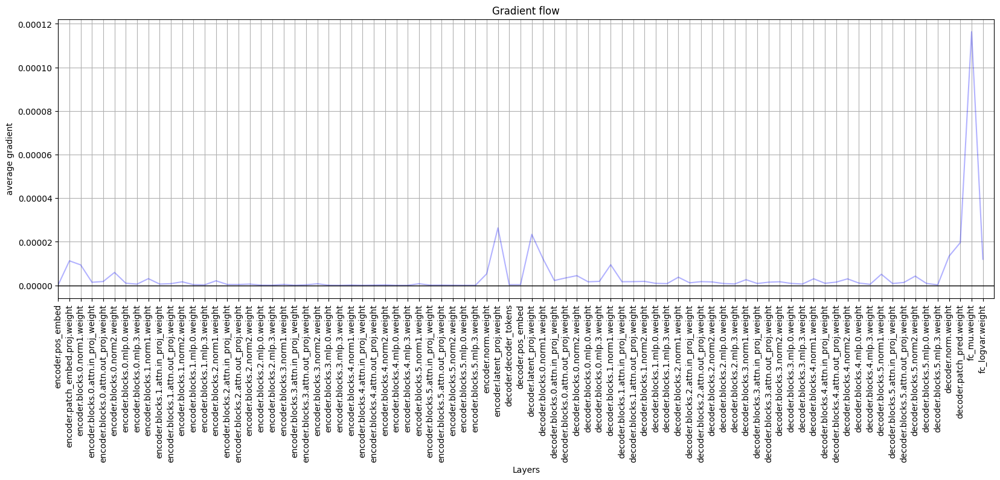

In [21]:
plot_grad_flow(model.named_parameters())

# Standard diagnostics of the latent space for its parameters

In [ ]:
from tqdm import tqdm

# Добавьте эту диагностику перед обучением
def diagnose_latent_space(VAE, train_loader, device):
    VAE.eval()
    latent_samples = []
    
    with torch.no_grad():
        for diffractions, classes in tqdm(train_loader):
            diffractions = diffractions.to(device)
            # ---- Encoder ----
            z, mu, logvar = model.encode(diffractions)
            # h = VAE.encoder(diffractions)
            # h_flat = h.view(h.size(0), -1)
            # mu, logvar = VAE.fc_mu(h_flat), VAE.fc_logvar(h_flat)
            # z = VAE.reparameterize(mu, logvar)
            latent_samples.append(z)
    
    latent_all = torch.cat(latent_samples, dim=0)
    
    print("=== LATENT SPACE ===")
    print(f"Shape: {latent_all.shape}")
    print(f"Mean: {latent_all.mean().item():.4f}")
    print(f"Std: {latent_all.std().item():.4f}")
    print(f"Min: {latent_all.min().item():.4f}")
    print(f"Max: {latent_all.max().item():.4f}")
    print(f"NaN: {torch.isnan(latent_all).any()}")
    print(f"Inf: {torch.isinf(latent_all).any()}")
    
    # Проверка распределения шума
    noise = torch.randn_like(latent_all)
    print(f"Noise std: {noise.std().item():.4f}")

# Запустите диагностику
diagnose_latent_space(model, train_loader, device)

100%|██████████| 162/162 [00:06<00:00, 26.18it/s]

=== ЛАТЕНТНОЕ ПРОСТРАНСТВО ===
Shape: torch.Size([1620, 32, 25, 30])
Mean: -0.0069
Std: 0.9758
Min: -5.7445
Max: 6.0791
NaN: False
Inf: False
Noise std: 1.0001


# Latent space inspection for VAE with two-dimensional latent maps (TSNE visualization)

100%|██████████| 162/162 [00:06<00:00, 25.54it/s]


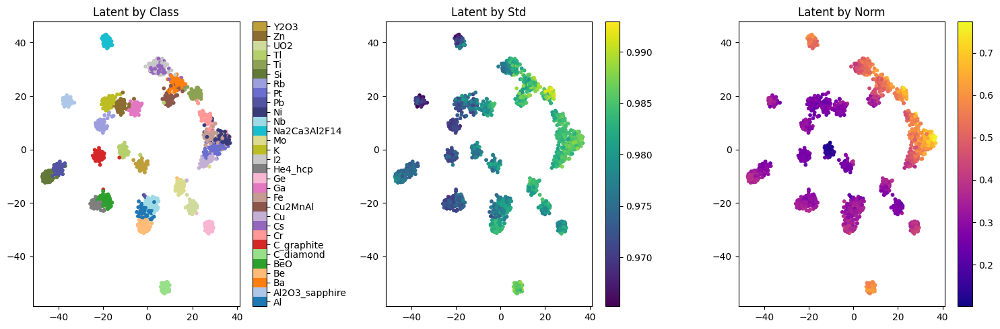

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap
import numpy as np
from tqdm import tqdm
from matplotlib.colors import ListedColormap

def visualize_spatial_latent(model, dataloader, device, method="tsne", class_names=None):

    model.eval()
    all_latents = []
    all_labels = []
    all_stds = []
    all_norms = []

    with torch.no_grad():
        for data, labels in tqdm(dataloader):

            data = data.to(device)
            labels = labels.to(device)

            # Encoder
            z, mu, logvar = model.encode(data)

            # ---- GLOBAL POOLING: reduce spatial map → vector ----
            z_vec     = torch.mean(z, dim=(2,3)).cpu().numpy()          # [B,256]
            mu_vec    = torch.mean(mu, dim=(2,3)).cpu().numpy()         # [B,256]
            logvar_vec = torch.mean(logvar, dim=(2,3)).cpu().numpy()    # [B,256]

            all_latents.append(z_vec)
            all_norms.append(np.linalg.norm(mu_vec, axis=1))
            all_stds.append(np.exp(0.5 * logvar_vec).mean(axis=1))
            all_labels.append(labels.cpu().numpy())

    all_latents = np.vstack(all_latents)
    all_norms   = np.concatenate(all_norms)
    all_stds    = np.concatenate(all_stds)
    all_labels  = np.concatenate(all_labels)

    # --- Dimensionality reduction ---
    if method == "tsne":
        reducer = TSNE(n_components=2, perplexity=30, random_state=42)
    elif method == "umap":
        reducer = umap.UMAP(n_components=2, random_state=42)
    else:
        reducer = PCA(n_components=2)

    lat2d = reducer.fit_transform(all_latents)

    # --- Plots ---
    plt.figure(figsize=(15,5))

    # By class - с названиями классов в colorbar
    plt.subplot(131)
    
    # Получаем уникальные классы и их количество
    unique_labels = np.unique(all_labels)
    n_classes = len(unique_labels)
    
    # Используем дискретную цветовую карту
    # cmap = plt.cm.get_cmap('tab20', n_classes)
    # cmap = plt.cm.get_cmap('gist_ncar', n_classes)

    base_colors = (
        list(plt.cm.tab20.colors) +
        list(plt.cm.tab20b.colors) +
        list(plt.cm.tab20c.colors)
    )

    cmap = ListedColormap(base_colors[:n_classes])
    
    scatter = plt.scatter(lat2d[:,0], lat2d[:,1], 
                         c=all_labels, 
                         cmap=cmap, 
                         s=10,
                         vmin=-0.5, 
                         vmax=n_classes-0.5)
    
    # Создаем colorbar с названиями классов
    cbar = plt.colorbar(scatter, ticks=range(n_classes))
    
    # Если переданы названия классов, используем их
    if class_names is not None:
        # Проверяем, что количество названий соответствует количеству классов
        if len(class_names) >= n_classes:
            cbar.ax.set_yticklabels([class_names[i] for i in range(n_classes)])
        else:
            print(f"Предупреждение: class_names содержит {len(class_names)} элементов, но есть {n_classes} классов")
            # Используем индексы как fallback
            cbar.ax.set_yticklabels([str(i) for i in range(n_classes)])
    else:
        # Если названий нет, используем просто индексы
        cbar.ax.set_yticklabels([str(i) for i in range(n_classes)])
    
    plt.title("Latent by Class")

    # Uncertainty
    plt.subplot(132)
    s = plt.scatter(lat2d[:,0], lat2d[:,1], c=all_stds, cmap="viridis", s=10)
    plt.colorbar(s)
    plt.title("Latent by Std")

    # Norm
    plt.subplot(133)
    s = plt.scatter(lat2d[:,0], lat2d[:,1], c=all_norms, cmap="plasma", s=10)
    plt.colorbar(s)
    plt.title("Latent by Norm")

    plt.tight_layout()
    plt.show()

    return all_latents, all_labels, lat2d

all_latents, all_labels, lat2d = visualize_spatial_latent(model, train_loader, device, method="tsne", class_names=crystals)

100%|██████████| 162/162 [00:06<00:00, 25.13it/s]


Fitting PCA on REAL data only...


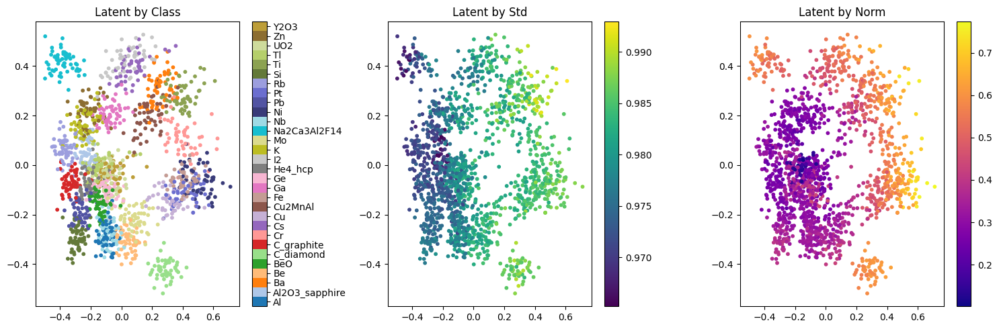

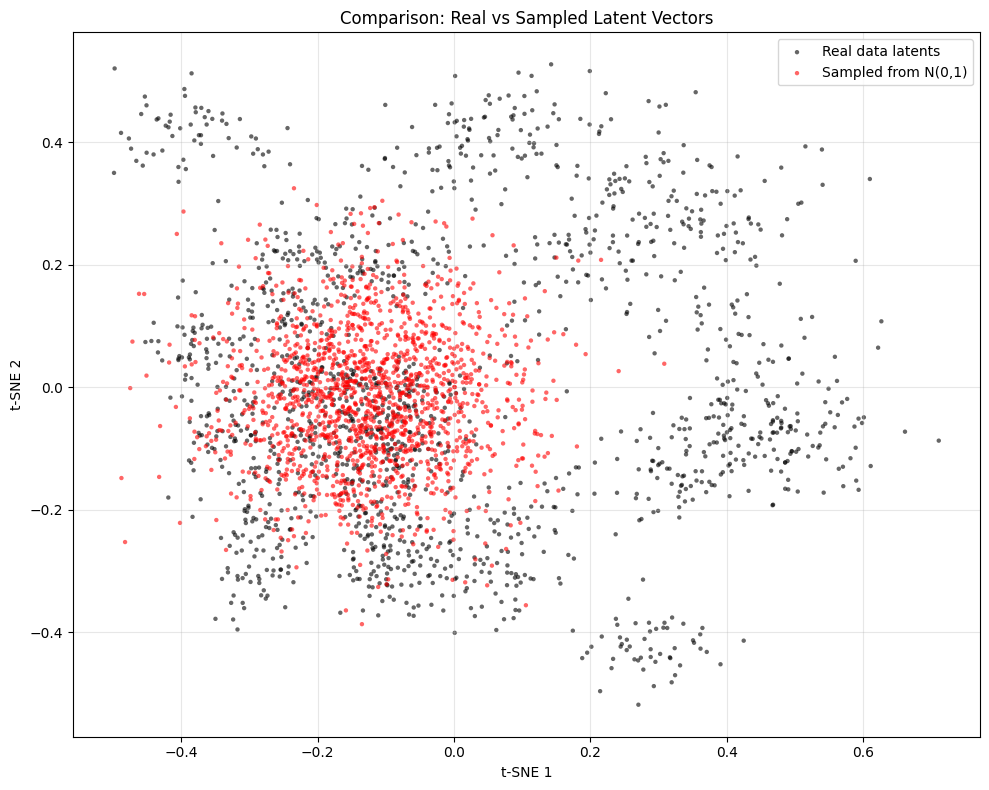

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap
import numpy as np
import torch
from tqdm import tqdm
from matplotlib.colors import ListedColormap

def visualize_spatial_latent(model, dataloader, device, method="tsne", class_names=None):

    model.eval()
    all_latents = []
    all_sampled = []
    all_labels = []
    all_stds = []
    all_norms = []

    with torch.no_grad():
        for data, labels in tqdm(dataloader):

            data = data.to(device)
            labels = labels.to(device)

            # Encoder
            z, mu, logvar = model.encode(data)

            sampled = 3 * torch.randn(z.size())  # семплирование из N(0, I)

            # ---- GLOBAL POOLING: reduce spatial map → vector ----
            z_vec     = torch.mean(z, dim=(2,3)).cpu().numpy()          # [B,32]
            sampled_vec     = torch.mean(sampled, dim=(2,3)).cpu().numpy()          # [B,32]
            mu_vec    = torch.mean(mu, dim=(2,3)).cpu().numpy()         # [B,32]
            logvar_vec = torch.mean(logvar, dim=(2,3)).cpu().numpy()    # [B,32]

            all_latents.append(z_vec)
            all_sampled.append(sampled_vec)
            all_norms.append(np.linalg.norm(mu_vec, axis=1))
            all_stds.append(np.exp(0.5 * logvar_vec).mean(axis=1))
            all_labels.append(labels.cpu().numpy())

    all_latents = np.vstack(all_latents)
    all_sampled = np.vstack(all_sampled)
    all_norms   = np.concatenate(all_norms)
    all_stds    = np.concatenate(all_stds)
    all_labels  = np.concatenate(all_labels)

    # --- Dimensionality reduction ---
    if method == "tsne":
        reducer = TSNE(n_components=2, perplexity=30, random_state=42)
    elif method == "umap":
        reducer = umap.UMAP(n_components=2, random_state=42)
    else:
        reducer = PCA(n_components=2)

    print(f"Fitting {method.upper()} on REAL data only...")
    reducer.fit(all_latents)  # Обучаем на реальных данных
    
    # Преобразуем и реальные, и семплированные
    lat2d = reducer.transform(all_latents)
    sampled_lat2d = reducer.transform(all_sampled)  # Применяем ТУ ЖЕ трансформацию

    # --- Plots ---
    plt.figure(figsize=(15,5))

    # By class - с названиями классов в colorbar
    plt.subplot(131)
    
    # Получаем уникальные классы и их количество
    unique_labels = np.unique(all_labels)
    n_classes = len(unique_labels)
    
    # Используем дискретную цветовую карту
    # cmap = plt.cm.get_cmap('tab20', n_classes)
    # cmap = plt.cm.get_cmap('gist_ncar', n_classes)

    base_colors = (
        list(plt.cm.tab20.colors) +
        list(plt.cm.tab20b.colors) +
        list(plt.cm.tab20c.colors)
    )

    cmap = ListedColormap(base_colors[:n_classes])
    
    scatter = plt.scatter(lat2d[:,0], lat2d[:,1], 
                         c=all_labels, 
                         cmap=cmap, 
                         s=10,
                         vmin=-0.5, 
                         vmax=n_classes-0.5)
    
    # Создаем colorbar с названиями классов
    cbar = plt.colorbar(scatter, ticks=range(n_classes))
    
    # Если переданы названия классов, используем их
    if class_names is not None:
        # Проверяем, что количество названий соответствует количеству классов
        if len(class_names) >= n_classes:
            cbar.ax.set_yticklabels([class_names[i] for i in range(n_classes)])
        else:
            print(f"Предупреждение: class_names содержит {len(class_names)} элементов, но есть {n_classes} классов")
            # Используем индексы как fallback
            cbar.ax.set_yticklabels([str(i) for i in range(n_classes)])
    else:
        # Если названий нет, используем просто индексы
        cbar.ax.set_yticklabels([str(i) for i in range(n_classes)])
    
    plt.title("Latent by Class")

    # Uncertainty
    plt.subplot(132)
    s = plt.scatter(lat2d[:,0], lat2d[:,1], c=all_stds, cmap="viridis", s=10)
    plt.colorbar(s)
    plt.title("Latent by Std")

    # Norm
    plt.subplot(133)
    s = plt.scatter(lat2d[:,0], lat2d[:,1], c=all_norms, cmap="plasma", s=10)
    plt.colorbar(s)
    plt.title("Latent by Norm")

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 8))

    # Оригинальные точки из реальных данных - черным
    plt.scatter(lat2d[:, 0], lat2d[:, 1], 
                c='black', alpha=0.6, s=10, 
                label='Real data latents', edgecolors='none')

    # Семплированные точки - красным
    plt.scatter(sampled_lat2d[:, 0], sampled_lat2d[:, 1], 
                c='red', alpha=0.6, s=10, 
                label='Sampled from N(0,1)', edgecolors='none')

    plt.xlabel('t-SNE 1')
    plt.ylabel('t-SNE 2')
    plt.title('Comparison: Real vs Sampled Latent Vectors')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    return all_latents, all_labels, lat2d

# Пример вызова функции с названиями классов
all_latents, all_labels, lat2d = visualize_spatial_latent(
    model, train_loader, device, method="pca", class_names=crystals
)

# Clustering metrics

In [83]:
import torch
import numpy as np
from tqdm import tqdm


def collect_latent_statistics(model, dataloader, device):
    model.eval()

    latents = []
    mus = []
    logvars = []
    labels_all = []

    with torch.no_grad():
        for data, labels in tqdm(dataloader):
            data = data.to(device)
            labels = labels.to(device)

            z, mu, logvar = model.encode(data)

            # Spatial → vector
            z_vec      = torch.mean(z, dim=(2, 3))
            mu_vec     = torch.mean(mu, dim=(2, 3))
            logvar_vec = torch.mean(logvar, dim=(2, 3))

            latents.append(z_vec.cpu())
            mus.append(mu_vec.cpu())
            logvars.append(logvar_vec.cpu())
            labels_all.append(labels.cpu())

    return {
        "z": torch.cat(latents).numpy(),
        "mu": torch.cat(mus).numpy(),
        "logvar": torch.cat(logvars).numpy(),
        "labels": torch.cat(labels_all).numpy()
    }


In [84]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score
)

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score



def kl_metrics(mu, logvar, eps=0.01):
    kl = 0.5 * (mu**2 + np.exp(logvar) - logvar - 1.0)

    return {
        "kl_per_dim": kl.mean(axis=0),
        "kl_per_sample": kl.sum(axis=1),
        "active_dims": int((kl.mean(axis=0) > eps).sum()),
        "mean_kl": float(kl.sum(axis=1).mean())
    }

def clustering_metrics(z, labels):
    return {
        "silhouette": float(silhouette_score(z, labels)),
        "calinski_harabasz": float(calinski_harabasz_score(z, labels)),
        "davies_bouldin": float(davies_bouldin_score(z, labels))
    }

def linear_probe(z, labels, n_splits=5):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    accs = []

    for train_idx, test_idx in skf.split(z, labels):
        clf = LogisticRegression(max_iter=3000, n_jobs=-1)
        clf.fit(z[train_idx], labels[train_idx])
        accs.append(accuracy_score(labels[test_idx], clf.predict(z[test_idx])))

    return {
        "linear_probe_mean": float(np.mean(accs)),
        "linear_probe_std": float(np.std(accs))
    }

def mutual_information_proxy(z, labels):
    from sklearn.model_selection import train_test_split

    X_train, X_test, y_train, y_test = train_test_split(
        z, labels, test_size=0.3, stratify=labels, random_state=42
    )

    clf = LogisticRegression(max_iter=3000, n_jobs=-1)
    clf.fit(X_train, y_train)

    return {
        "mi_proxy_acc": float(accuracy_score(y_test, clf.predict(X_test)))
    }


In [92]:
def evaluate_latent_space(model, dataloader, device):
    stats = collect_latent_statistics(model, dataloader, device)

    z      = stats["z"]
    mu     = stats["mu"]
    logvar = stats["logvar"]
    labels = stats["labels"]

    results = {}

    results["kl"] = kl_metrics(mu, logvar)
    results["clustering"] = clustering_metrics(z, labels)
    results["linear_probe"] = linear_probe(z, labels)
    results["mi_proxy"] = mutual_information_proxy(z, labels)

    return results

results = evaluate_latent_space(model, train_loader, device)

print(results["kl"])
print(results["clustering"])
print(results["linear_probe"])
print(results["mi_proxy"])


100%|██████████| 162/162 [00:06<00:00, 25.48it/s]


{'kl_per_dim': array([0.00365566, 0.00301769, 0.00330032, 0.00269373, 0.00260729,
       0.00295146, 0.00381722, 0.00281821, 0.00319634, 0.00377576,
       0.00450258, 0.00454738, 0.00440211, 0.00381631, 0.00442304,
       0.00421297, 0.00324911, 0.00304909, 0.00281086, 0.00350263,
       0.0029412 , 0.00260946, 0.00272297, 0.00338575, 0.00212739,
       0.00302934, 0.0036902 , 0.00425481, 0.00225938, 0.00254897,
       0.00410436, 0.00239517], dtype=float32), 'kl_per_sample': array([0.06882435, 0.06769073, 0.0883801 , ..., 0.22573507, 0.09052908,
       0.0936451 ], shape=(1620,), dtype=float32), 'active_dims': 0, 'mean_kl': 0.10641876608133316}
{'silhouette': 0.1309511363506317, 'calinski_harabasz': 183.09979248046875, 'davies_bouldin': 2.409143810185531}
{'linear_probe_mean': 0.84320987654321, 'linear_probe_std': 0.015419748144193604}
{'mi_proxy_acc': 0.8353909465020576}


# Loading samples for validation

In [116]:
#array([1.e+07, 2.e+07, 5.e+07, 1.e+08, 2.e+08, 5.e+08])
maxStats = 5.e+08
minI = max(df['Pulce duration'].unique())

df_test = df.loc[((df['Stats'] == maxStats) & (df['Pulce duration'] == minI))]
df_test = df_test.reset_index(drop= True)

Crystal_tags = df_test['Crystal']

Crystal_tags_encoded = label_encoder.fit_transform(Crystal_tags)

Crystal_tags_encoded = torch.LongTensor(Crystal_tags_encoded)
Crystal_tags_encoded = Crystal_tags_encoded.to(device)

# Преобразование матриц в numpy массив перед преобразованием в тензоры
df_test_matrices = np.array(df_test['Matrix'].tolist())

# Преобразование данных в тензоры PyTorch
df_test_tensor = torch.FloatTensor(df_test_matrices)
df_test_tensor = df_test_tensor.unsqueeze(1)
df_test_tensor = df_test_tensor * 2.0 - 1.0

df_test_tensor = df_test_tensor.to(device)
print(df_test_tensor.size())
print(Crystal_tags_encoded.size())

df_test_tensor = df_test_tensor.to(device)

torch.Size([30, 1, 250, 480])
torch.Size([30])


# Reconstruction verification for VAE

Loss: 0.1803, Recon Loss: 0.0393, KL Loss: 0.0470


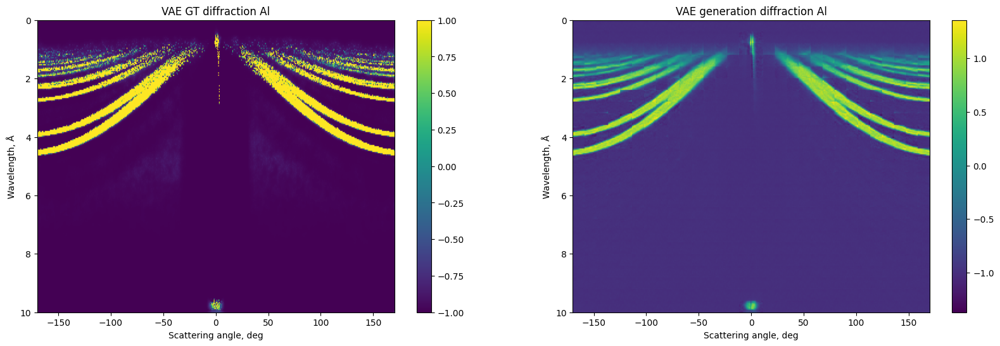

Loss: 0.2174, Recon Loss: 0.0754, KL Loss: 0.0473


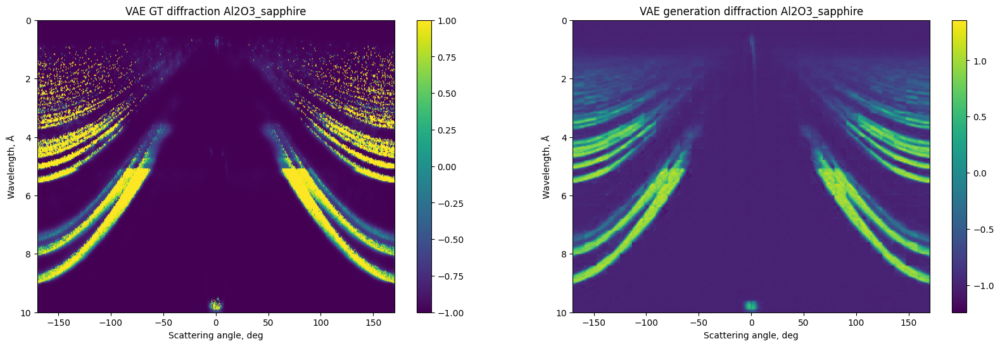

Loss: 0.1504, Recon Loss: 0.0144, KL Loss: 0.0453


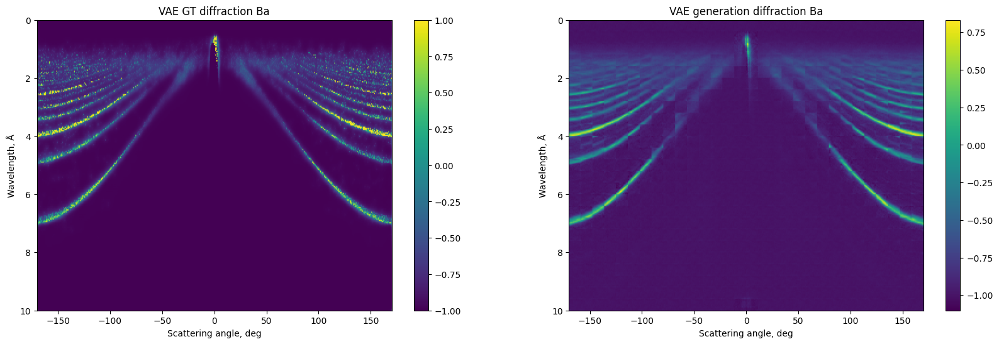

Loss: 0.1635, Recon Loss: 0.0296, KL Loss: 0.0446


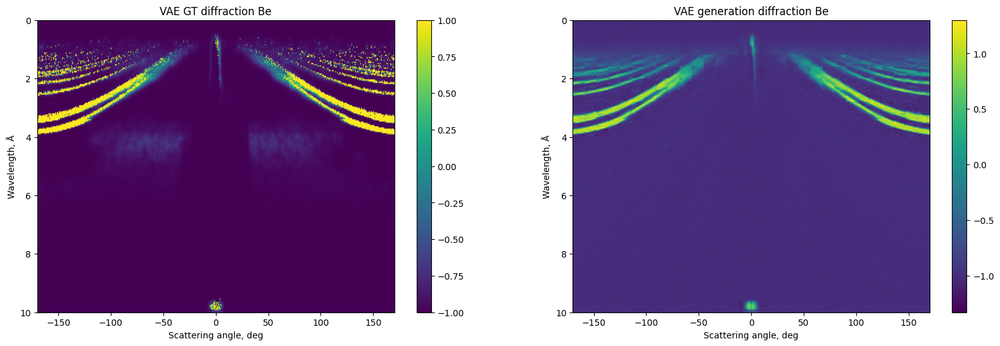

Loss: 0.1953, Recon Loss: 0.0569, KL Loss: 0.0461


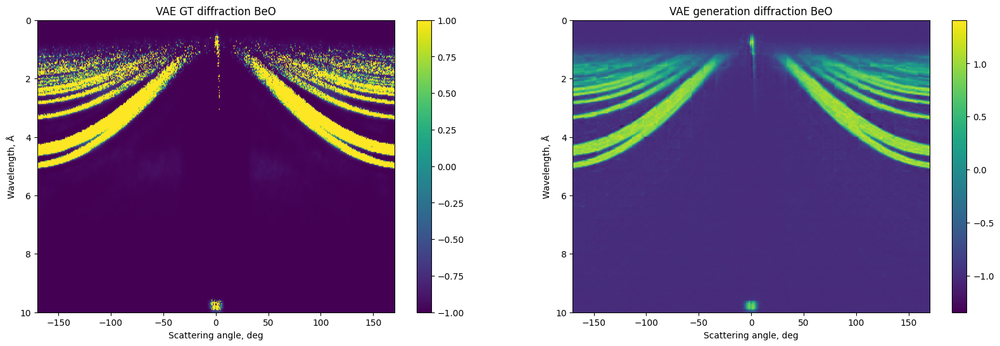

Loss: 0.1363, Recon Loss: 0.0156, KL Loss: 0.0402


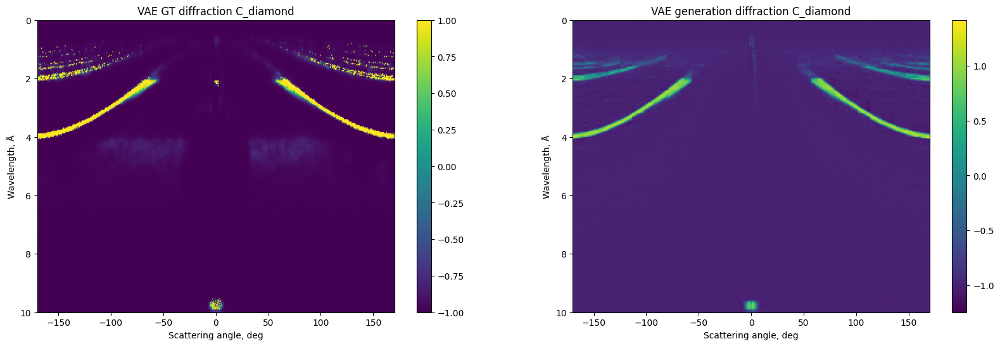

Loss: 0.1956, Recon Loss: 0.0516, KL Loss: 0.0480


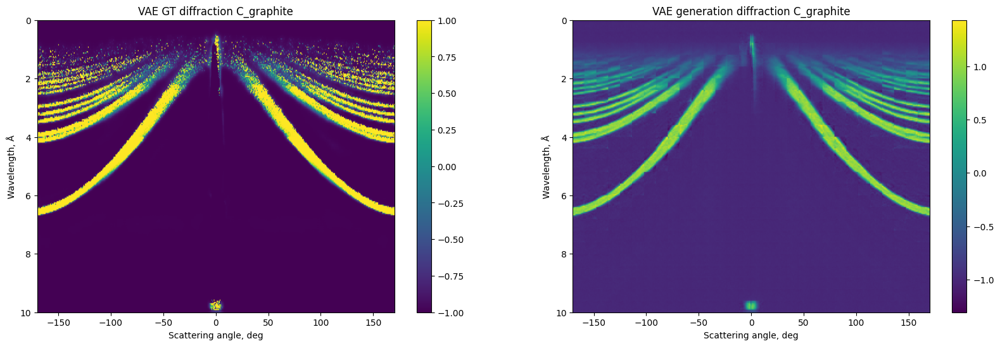

Loss: 0.1820, Recon Loss: 0.0496, KL Loss: 0.0441


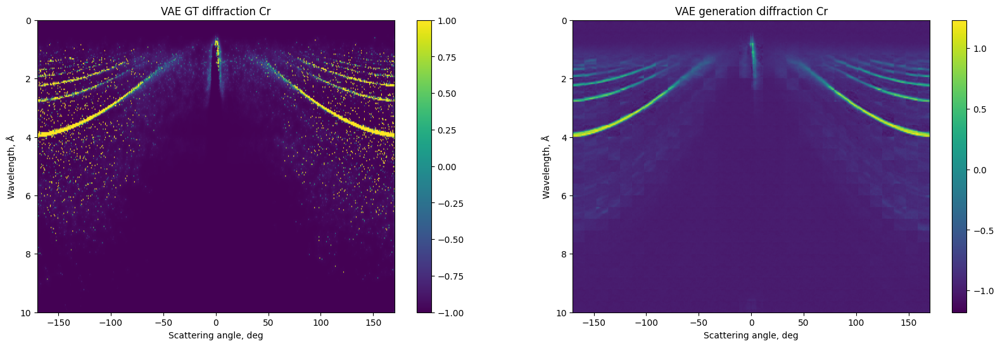

Loss: 0.1591, Recon Loss: 0.0171, KL Loss: 0.0473


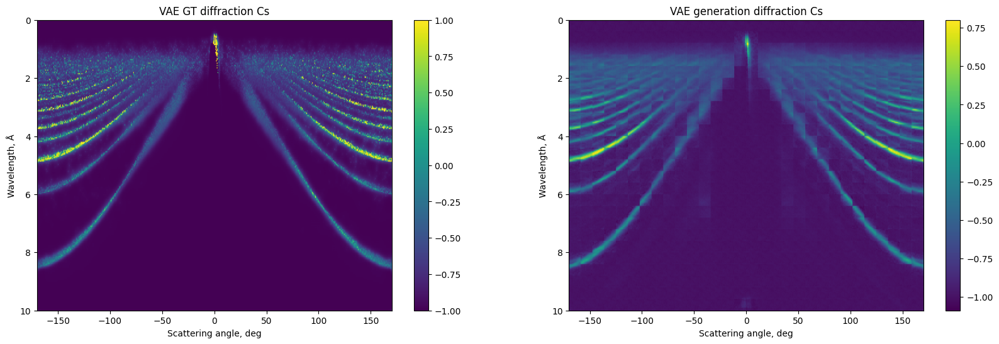

Loss: 0.1651, Recon Loss: 0.0298, KL Loss: 0.0451


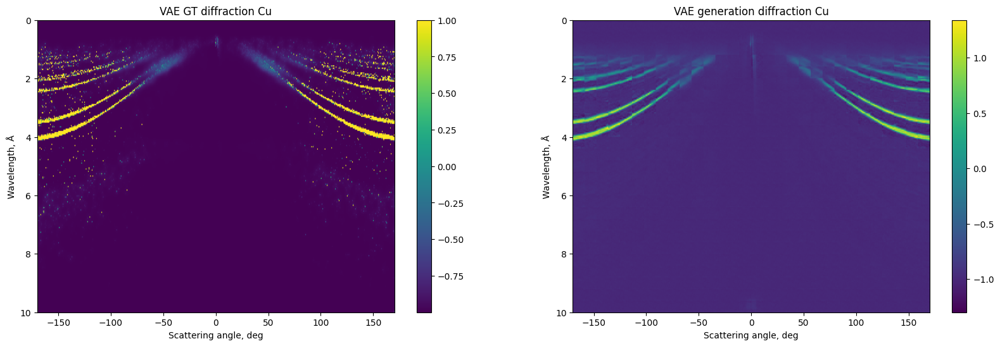

Loss: 0.1904, Recon Loss: 0.0456, KL Loss: 0.0483


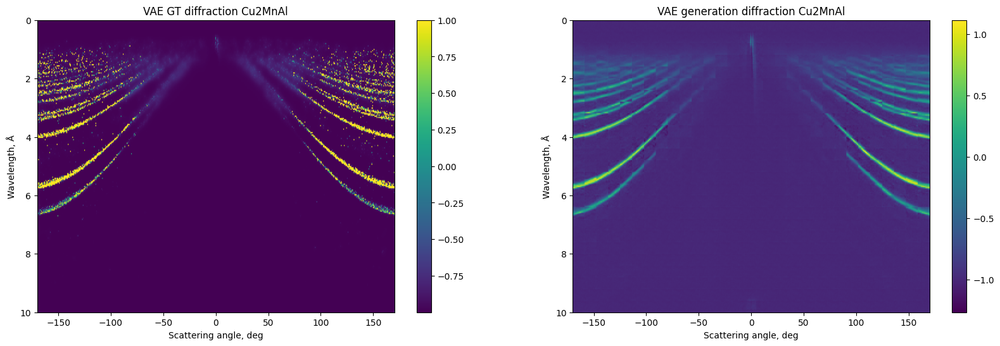

Loss: 0.1554, Recon Loss: 0.0251, KL Loss: 0.0434


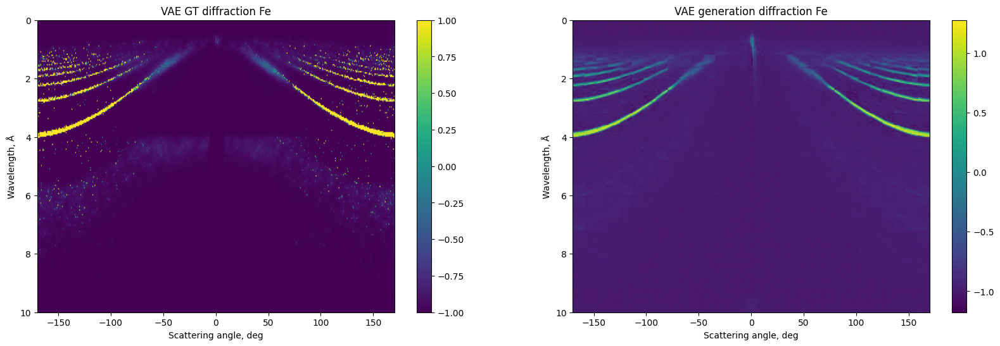

Loss: 0.2063, Recon Loss: 0.0670, KL Loss: 0.0465


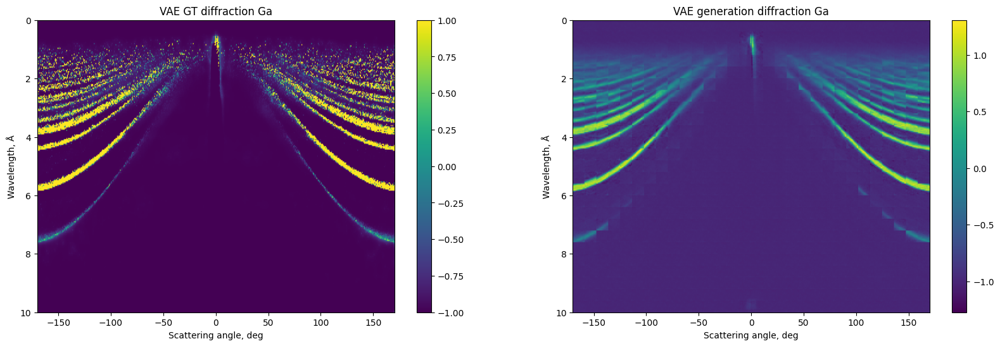

Loss: 0.1767, Recon Loss: 0.0361, KL Loss: 0.0469


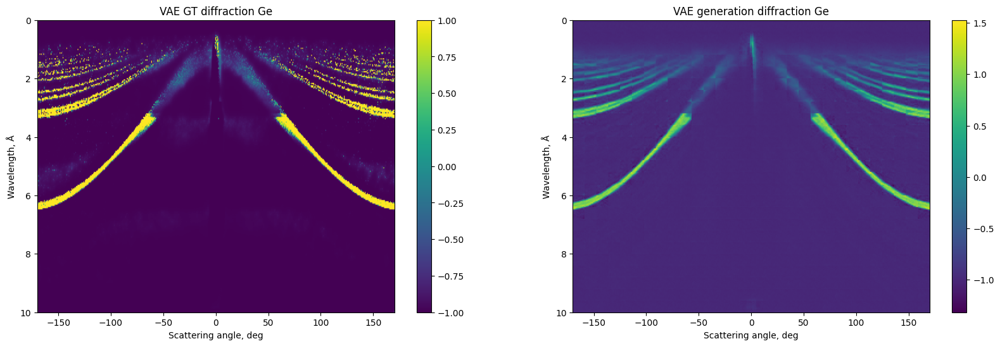

Loss: 0.1886, Recon Loss: 0.0466, KL Loss: 0.0473


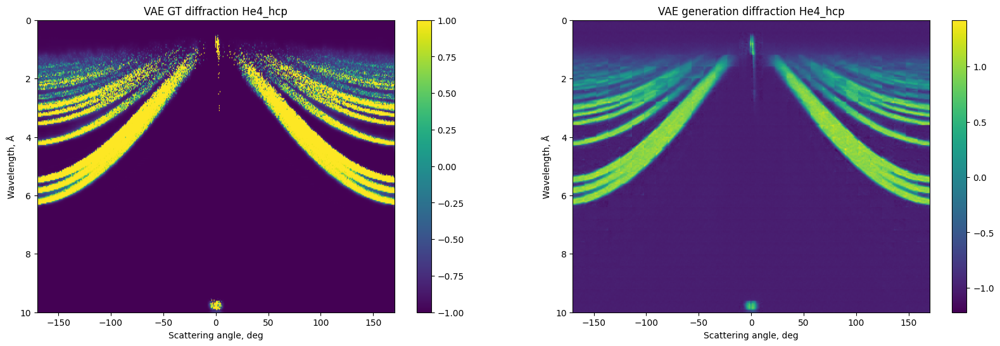

Loss: 0.2155, Recon Loss: 0.0749, KL Loss: 0.0469


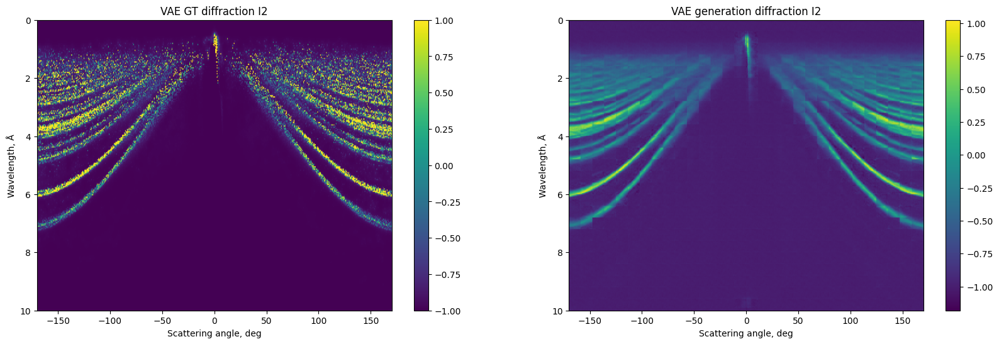

Loss: 0.2704, Recon Loss: 0.1269, KL Loss: 0.0478


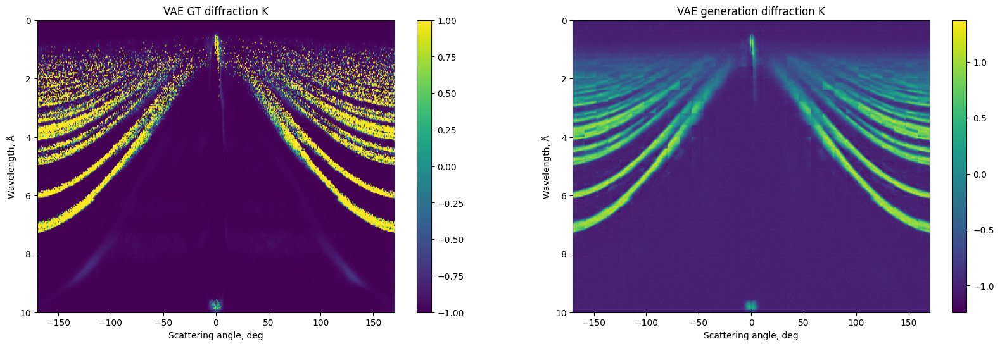

Loss: 0.1672, Recon Loss: 0.0258, KL Loss: 0.0471


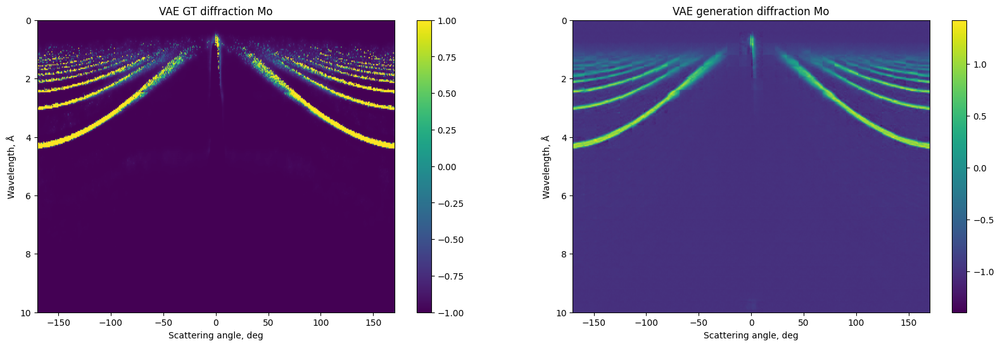

Loss: 0.3177, Recon Loss: 0.1770, KL Loss: 0.0469


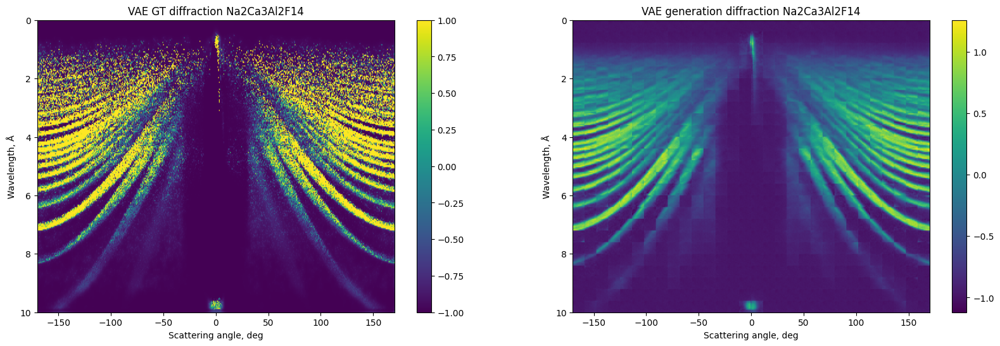

Loss: 0.1770, Recon Loss: 0.0341, KL Loss: 0.0476


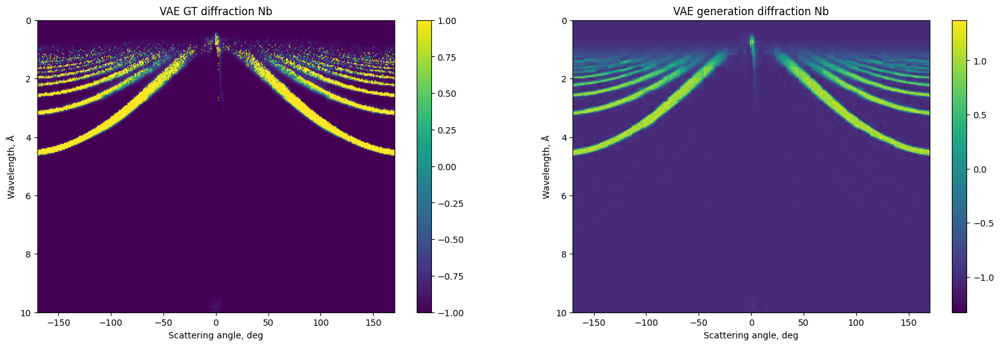

Loss: 0.1749, Recon Loss: 0.0381, KL Loss: 0.0456


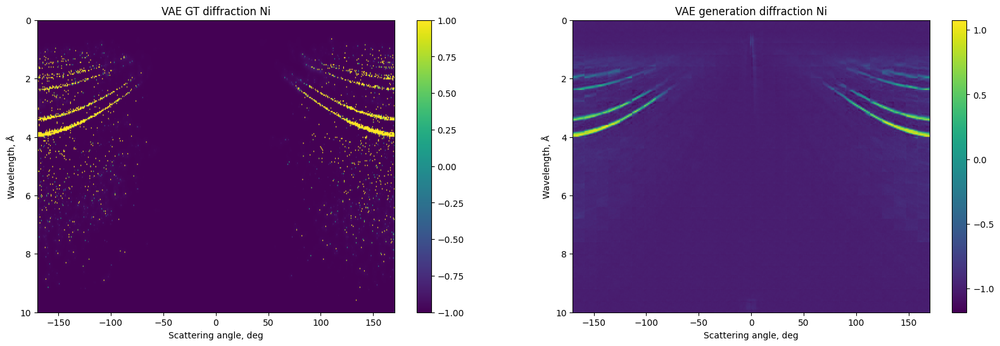

Loss: 0.1926, Recon Loss: 0.0492, KL Loss: 0.0478


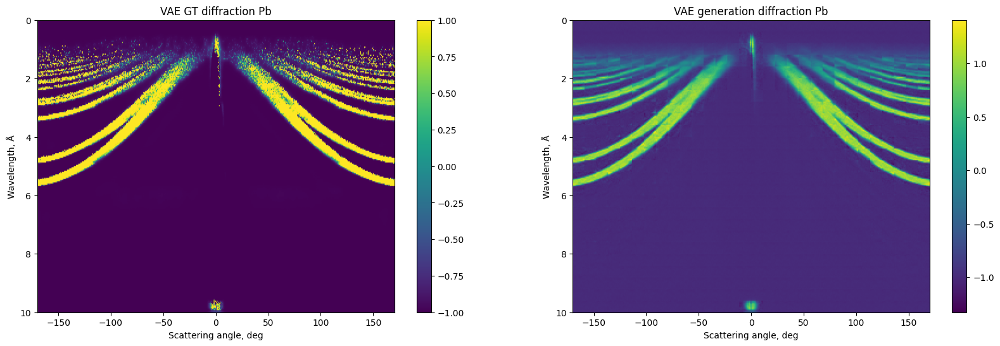

Loss: 0.1504, Recon Loss: 0.0164, KL Loss: 0.0447


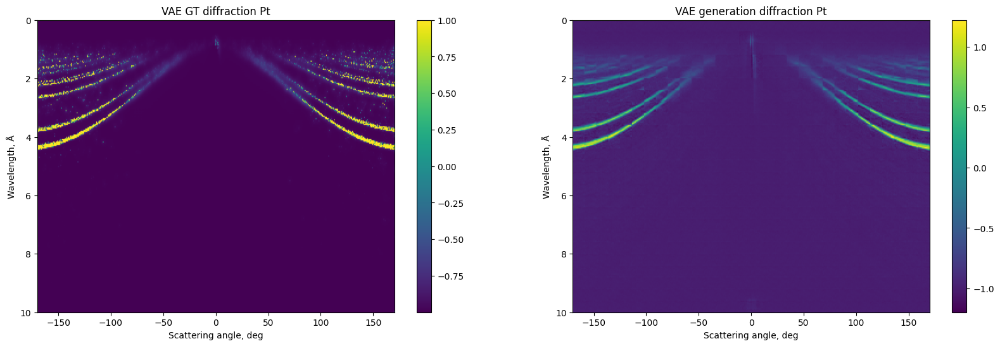

Loss: 0.2516, Recon Loss: 0.1079, KL Loss: 0.0479


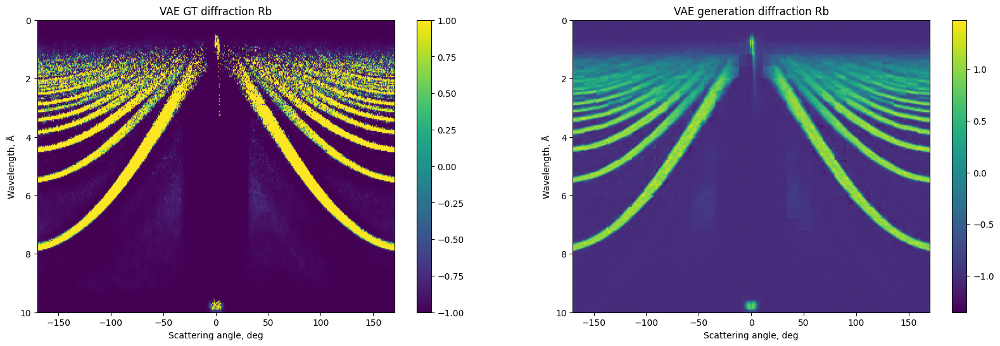

Loss: 0.1935, Recon Loss: 0.0512, KL Loss: 0.0474


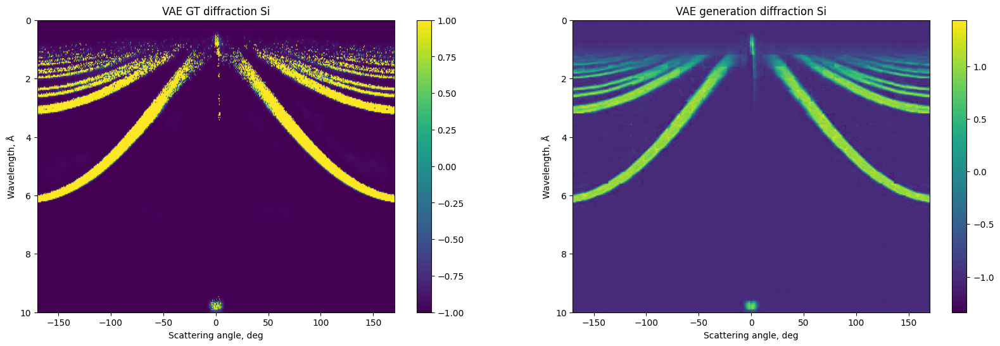

Loss: 0.1714, Recon Loss: 0.0480, KL Loss: 0.0411


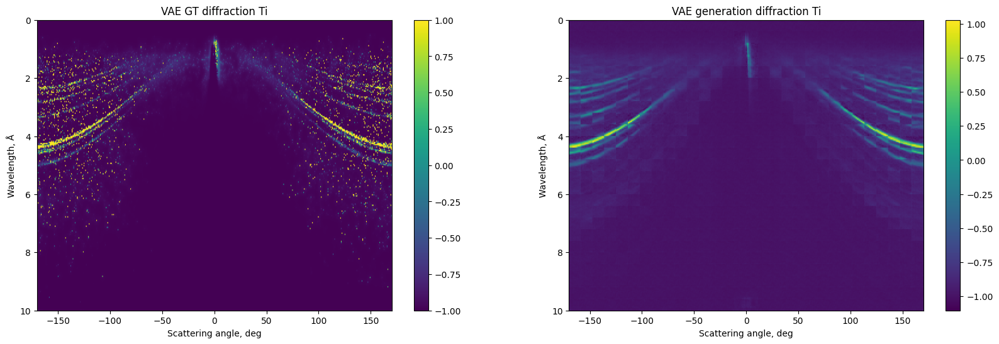

Loss: 0.2029, Recon Loss: 0.0630, KL Loss: 0.0466


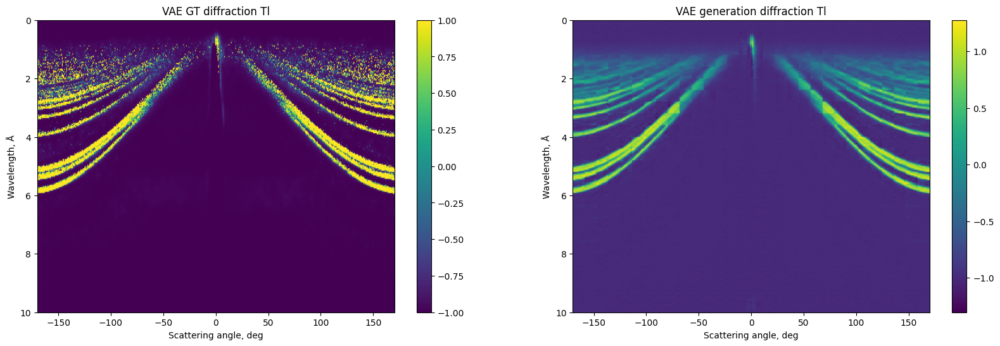

Loss: 0.1724, Recon Loss: 0.0346, KL Loss: 0.0459


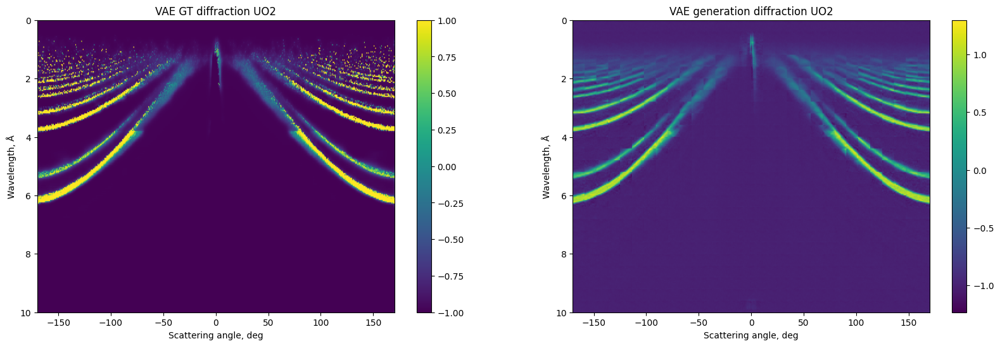

Loss: 0.1951, Recon Loss: 0.0539, KL Loss: 0.0471


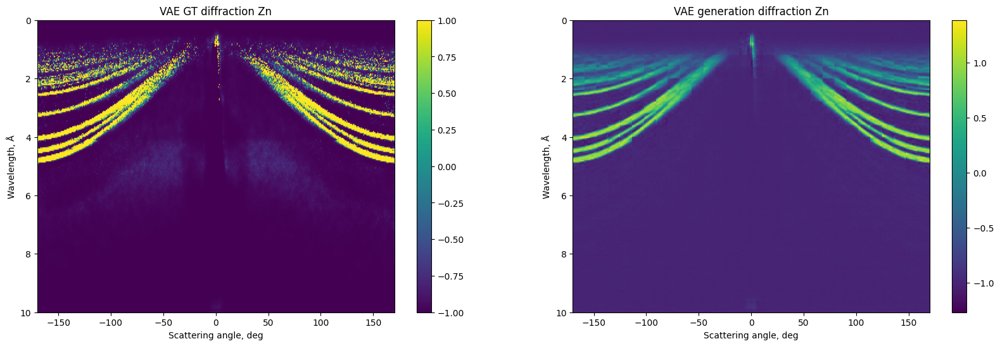

Loss: 0.2508, Recon Loss: 0.1071, KL Loss: 0.0479


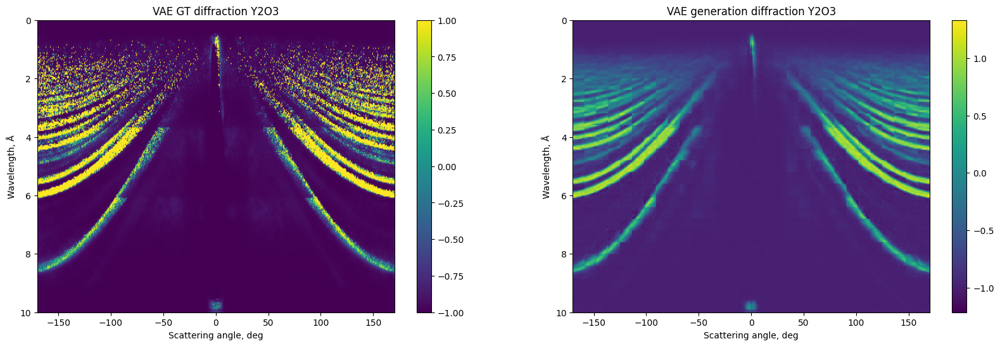

In [117]:
val_dataset = TensorDataset(df_test_tensor, Crystal_tags_encoded)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)


with torch.no_grad():
    for batch_idx, (data, labels) in enumerate(val_loader):
        data = data.to(device)
        labels = labels.to(device)
        
        recon_data, mean, logvar = model(data)
        # loss, recon_loss, kl_loss = spatial_vae_loss_free_bits(recon_data, data, mean, logvar, free_bits_threshold=free_bits_threshold)
        loss, recon_loss, kl_loss = vae_loss(recon_data, data, mean, logvar, beta=3)
        
        print(f'Loss: {loss:.4f}, '
            f'Recon Loss: {recon_loss:.4f}, KL Loss: {kl_loss:.4f}')
        
        generated_diffractions = recon_data.squeeze().cpu().numpy()
        gt_diffractions = data.squeeze().cpu().numpy()

        # Создаем фигуру и оси
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

        # Первый график
        im1 = ax1.imshow(gt_diffractions, cmap='viridis', aspect='auto', extent=(-170, 170, 10, 0))
        ax1.set_title(f"VAE GT diffraction {Crystal_tags.tolist()[batch_idx]}")
        ax1.set_xlabel('Scattering angle, deg')
        ax1.set_ylabel('Wavelength, Å')
        plt.colorbar(im1)

        # Первый график
        im2 = ax2.imshow(generated_diffractions, cmap='viridis', aspect='auto', extent=(-170, 170, 10, 0))
        ax2.set_title(f"VAE generation diffraction {Crystal_tags.tolist()[batch_idx]}")
        ax2.set_xlabel('Scattering angle, deg')
        ax2.set_ylabel('Wavelength, Å')
        plt.colorbar(im2)

        # plt.savefig(f'VAE Results/{Crystal_tags.tolist()[i]} Diffraction VAE.jpg')

        plt.show()

# Saving/loading models

In [29]:
# допустим, твоя текущая модель называется vae
save_path = "models/ResNet_VAE_UnCondition_2d_lattent_space.pth"
torch.save(model.state_dict(), save_path)
print(f"✅ Модель сохранена в {save_path}")

✅ Модель сохранена в models/ResNet_VAE_UnCondition_2d_lattent_space.pth


In [30]:
model.load_state_dict(torch.load("models/ResNet_VAE_UnCondition_2d_lattent_space.pth"))
model.to(device)

ResNetAutoEncoder(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (encoder): Sequential(
    (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=Fal